In [1]:
import sys
#sys.path.append('../models')

import datetime
import os
import sys
import traceback
import torch
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
import pandas as pd
#import pytorch_lightning as pl
import numpy as np

from sequence_networks import *
from datasets import *
from util import *

from matplotlib import pyplot as plt
# from torch.nn import Conv1d, Dropout, MaxPool1d, Flatten
from torch.utils.data.sampler import SubsetRandomSampler
from tqdm import tqdm
from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import log_loss, mean_squared_error

if torch.cuda.is_available():  
    device = torch.device('cuda:0')
    print('Using GPU')
else:
    device = torch.device('cpu')
    print('Using CPU')

Using CPU


## Data Analysis

In [2]:
filepath = 'data/indexData.csv'
df = pd.read_csv(filepath)

df['Date'] = pd.to_datetime(df['Date'])

print('Indexes: {}'.format(pd.unique(df['Index'])))

df.head()

Indexes: ['NYA' 'IXIC' 'HSI' '000001.SS' 'GSPTSE' '399001.SZ' 'NSEI' 'GDAXI' 'KS11'
 'SSMI' 'TWII' 'J203.JO' 'N225' 'N100']


,Index,Date,Open,High,Low,Close,Adj Close,Volume
0,NYA,1965-12-31,528.690002,528.690002,528.690002,528.690002,528.690002,0.0
1,NYA,1966-01-03,527.210022,527.210022,527.210022,527.210022,527.210022,0.0
2,NYA,1966-01-04,527.840027,527.840027,527.840027,527.840027,527.840027,0.0
3,NYA,1966-01-05,531.119995,531.119995,531.119995,531.119995,531.119995,0.0
4,NYA,1966-01-06,532.070007,532.070007,532.070007,532.070007,532.070007,0.0


No handles with labels found to put in legend.


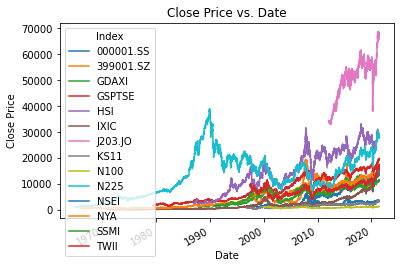

<Figure size 1440x576 with 0 Axes>

In [3]:
#df = df.set_index('Date')
pivot_df = df.pivot_table(values='Close', index='Date', columns='Index')
#print(pivot_df.head(100))

# Graph close amount per index over time (pre-interpolation)
fig, ax = plt.subplots(nrows=1, ncols=1)
plt.rcParams["figure.figsize"] = (20,8);
fig = plt.figure();
ax.legend(loc = "upper left");
ax.set_title("Close Price vs. Date")
ax.set_ylabel("Close Price")
pivot_df.plot(ax=ax);

# Graph close amount per index over time (post-interpolation)

## Data Cleansing

# Method 1: predict the closing prices of all 14 indexes on a day

# Method 2: predict the closing prices of 1 stock on a day

## Data loading for experiment

In [4]:
data_perc = 1.0

#labeled_dataset = CreditCardFraudDataset(filepath, data_perc)

dataset = 'Stocks'

data_size = 50000
train_ratio = 0.7
variable_seq_len = False

if variable_seq_len:
    seq_len = [3, 30]
else:
    seq_len = 20

n_train_samples = int(train_ratio*data_size)
n_test_samples = int((1-train_ratio)*data_size)

if dataset is 'Stocks':
    label_type = 'discrete'
    filepath = 'data/transformed_indexData.csv'
    label_name = 'Close'
    train_dataset = StocksSequenceDataset(filepath, n_samples=n_train_samples, variable_seq_len=variable_seq_len, seq_len=seq_len, label_name=label_name)
    test_dataset = StocksSequenceDataset(filepath, n_samples=n_test_samples, variable_seq_len=variable_seq_len, seq_len=seq_len, label_name=label_name)
    num_classes = 2
    #loss_func = F.mean_squared_error
    bl_loss_func = mean_squared_error

# Load data into pandas, find average of each column
#mean = train_dataset.mean()
#feature_mean = mean.drop(label_name).to_numpy()

# Data loading params
batch_size = 2
shuffle = True
random_seed = 32

train_size = int(np.floor(data_size * train_ratio))

indices = list(range(data_size))

if shuffle:
    np.random.seed(random_seed)
    np.random.shuffle(indices)
    
# train_indices, test_indices = indices[:train_size], indices[train_size:]

# print(len(train_indices))
# print(len(test_indices))
print(len(train_dataset))
print(len(test_dataset))

train_sampler = SubsetRandomSampler(list(range(n_train_samples)))

test_sampler = SubsetRandomSampler(list(range(n_test_samples)))

# Create dataloaders
train_loader = torch.utils.data.DataLoader(train_dataset, 
                                           batch_size=batch_size, 
                                           sampler=train_sampler,
                                           collate_fn=collate_fn)
test_loader = torch.utils.data.DataLoader(test_dataset, 
                                           batch_size=batch_size, 
                                           sampler=test_sampler, 
                                          collate_fn=collate_fn)

print(next(iter(train_loader)))
print(next(iter(test_loader)))

start_i: 20553
len_seq: 20
index_data.shape[0]: 20574
start_i: 15262
len_seq: 20
index_data.shape[0]: 15283
start_i: 11108
len_seq: 20
index_data.shape[0]: 11129
start_i: 20187
len_seq: 20
index_data.shape[0]: 20208
35000
15000
(tensor([[ 0.0275,  0.0435,  0.0430,  0.0319,  0.0288,  0.0378,  0.0376,  0.0376,
          0.0376,  0.0360,  0.0385,  0.0456,  0.0497,  0.0494,  0.0502,  0.0550,
          0.0580,  0.0539,  0.0533,  0.0648],
        [-0.7816, -0.7815, -0.7814, -0.7819, -0.7822, -0.7813, -0.7807, -0.7809,
         -0.7805, -0.7801, -0.7811, -0.7815, -0.7812, -0.7807, -0.7803, -0.7804,
         -0.7810, -0.7815, -0.7817, -0.7825]]), tensor([20, 20]), tensor([ 0.0663, -0.7825], dtype=torch.float64))
(tensor([[ 0.4146,  0.4235,  0.4238,  0.4264,  0.4234,  0.4170,  0.4157,  0.4201,
          0.4209,  0.4156,  0.4194,  0.4181,  0.4146,  0.4161,  0.4202,  0.4212,
          0.4156,  0.4046,  0.3990,  0.4031],
        [-0.8058, -0.8058, -0.8060, -0.8063, -0.8063, -0.8065, -0.8063, -0.80

# Experiments

### Parameters

In [5]:
epochs = 10
epoch_list = list(range(1, epochs+1))

#n_feature = train_dataset[0][0].size()[1]

n_classes = 1

wdecay = 5e-4
lr = 0.03
nesterov = True
no_decay = ['bias', 'bn']

loss_func = F.mse_loss

### Train and Test methods

In [6]:
def train_supervised(model, train_loader, test_loader, opt, loss_func, epochs=10):
    train_loss_list = []
    test_loss_list = []
    
    for epoch in range(epochs):
        losses = AverageMeter()

        progress_bar = tqdm(enumerate(train_loader))
        
        for batch_index, (sequences, sizes, targets) in enumerate(train_loader):
            #if features is None or target
            
            try:
                sequences = sequences.to(device)
                targets = targets.to(device)
                
                sequences = sequences.unsqueeze(-1)

                pred = model(sequences)
                
                pred = pred.squeeze()
                
#                 print('after')
#                 print(targets)
#                 print(pred)

                loss = loss_func(pred.float(), targets.float())

                losses.update(loss)

                # Update progress bar
                progress_bar.set_description("Train Epoch: {epoch}/{epochs:4}. Loss: {loss:.4f}.".format(
                            epoch=epoch + 1,
                            epochs=epochs,
                            batch=batch_index + 1,
                            loss=losses.avg))

                opt.zero_grad()
                loss.backward(retain_graph=True)
                opt.step()

            except RuntimeError as error:
                print('RuntimeError: {}'.format(error))
                traceback.print_exc()
        
        test_loss = test(test_loader, model, loss_func, epoch)
        
        train_loss_list.append(losses.avg.detach().numpy())
        test_loss_list.append(test_loss.data.detach().numpy())
        
        
    return train_loss_list, test_loss_list 

In [7]:
def test(test_loader, model, loss_func, epoch):
    losses = AverageMeter()
    
    test_loader = tqdm(test_loader)
    
    with torch.no_grad():
        for batch_index, (sequences, sizes, targets) in enumerate(test_loader):
            try:
                sequences = sequences.to(device)
                targets = targets.to(device)

                sequences = sequences.unsqueeze(-1)

                pred = model(sequences)
                
                pred = pred.squeeze()

                loss = loss_func(pred, targets)

                losses.update(loss)

                test_loader.set_description("Test Iter: {batch:4}/{iter:4}. Loss: {loss:.4f}.".format(
                    batch=batch_index + 1,
                    iter=len(test_loader),
                    loss=losses.avg))
            except IndexError as error:
                print('IndexError: {}'.format(error))
                print(traceback.format_exc())
                print(batch_index)
                print(features)
                print(targets)
    return losses.avg

## LSTM

In [8]:
input_size = 1
hidden_size=20
output_size = 1

lstm_model = LSTM(input_size=input_size, hidden_size=hidden_size, output_size=output_size)

# Use 1 for batch_size since the sequence length varies
#batch_size = 1

In [ ]:
opt_lstm = torch.optim.SGD(lstm_model.parameters(), lr = 0.00001)

lstm_train_loss_list, lstm_test_loss_list = train_supervised(lstm_model, train_loader, test_loader, opt_lstm, loss_func, epochs=epochs)

Train Epoch: 1/  10. Loss: 1.8588.: : 0it [01:00, ?it/s]
Test Iter:  189/7500. Loss: 1.1675.:   2%|  | 151/7500 [00:00<00:15, 481.70it/s]


Test Iter:  379/7500. Loss: 1.2523.:   5%|  | 366/7500 [00:00<00:14, 505.95it/s]


Test Iter:  570/7500. Loss: 1.3990.:   7%|▏ | 528/7500 [00:01<00:13, 523.71it/s]


Test Iter:  760/7500. Loss: 1.4686.:  10%|▏ | 746/7500 [00:01<00:12, 525.72it/s]


Test Iter:  875/7500. Loss: 1.4973.:  11%|▏ | 853/7500 [00:01<00:12, 528.78it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 1685/7500. Loss: 1.5013.:  22%|▏| 1644/7500 [00:03<00:09, 631.92it/s]


Test Iter: 1876/7500. Loss: 1.4811.:  24%|▏| 1834/7500 [00:03<00:09, 592.36it/s]


Test Iter: 2066/7500. Loss: 1.4791.:  28%|▎| 2064/7500 [00:03<00:09, 546.72it/s]


Test Iter: 2257/7500. Loss: 1.5243.:  30%|▎| 2233/7500 [00:04<00:09, 541.54it/s]


Test Iter: 2448/7500. Loss: 1.5396.:  32%|▎| 2399/7500 [00:04<00:09, 532.48it/s]


Test Iter: 2596/7500. Loss: 1.5491.:  34%|▎| 2565/7500 [00:04<00:09, 543.30it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 3388/7500. Loss: 1.5709.:  45%|▍| 3345/7500 [00:06<00:06, 635.60it/s]


Test Iter: 3579/7500. Loss: 1.5641.:  47%|▍| 3543/7500 [00:06<00:06, 642.29it/s]


Test Iter: 3770/7500. Loss: 1.5584.:  50%|▍| 3742/7500 [00:06<00:05, 648.31it/s]


Test Iter: 3961/7500. Loss: 1.5540.:  52%|▌| 3932/7500 [00:06<00:06, 589.49it/s]


Test Iter: 4152/7500. Loss: 1.5667.:  55%|▌| 4109/7500 [00:07<00:06, 558.36it/s]


Test Iter: 4333/7500. Loss: 1.5796.:  58%|▌| 4333/7500 [00:07<00:05, 547.23it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 5098/7500. Loss: 1.5751.:  68%|▋| 5082/7500 [00:09<00:04, 597.68it/s]


Test Iter: 5289/7500. Loss: 1.5799.:  70%|▋| 5281/7500 [00:09<00:03, 636.69it/s]


Test Iter: 5480/7500. Loss: 1.5763.:  73%|▋| 5480/7500 [00:09<00:03, 651.16it/s]


Test Iter: 5672/7500. Loss: 1.5652.:  75%|▋| 5614/7500 [00:09<00:02, 659.92it/s]


Test Iter: 5863/7500. Loss: 1.5570.:  77%|▊| 5811/7500 [00:10<00:02, 604.64it/s]


Test Iter: 6053/7500. Loss: 1.5562.:  81%|▊| 6050/7500 [00:10<00:02, 562.50it/s]


Test Iter: 6078/7500. Loss: 1.5555.:  81%|▊| 6050/7500 [00:10<00:02, 562.50it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 7095/7500. Loss: 1.5589.:  94%|▉| 7049/7500 [00:12<00:00, 590.57it/s]


Test Iter: 7286/7500. Loss: 1.5520.:  97%|▉| 7246/7500 [00:12<00:00, 630.31it/s]


Test Iter: 7477/7500. Loss: 1.5508.:  99%|▉| 7443/7500 [00:12<00:00, 644.52it/s]


Test Iter: 7500/7500. Loss: 1.5543.: 100%|█| 7500/7500 [00:13<00:00, 575.91it/s]

Train Epoch: 1/  10. Loss: 1.8588.: : 0it [01:16, ?it/s]

Train Epoch: 2/  10. Loss: 0.1698.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 0.0974.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 0.2057.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 0.2612.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 0.2602.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 0.2344.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 0.4410.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.5918.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.4349.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.3251.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.2285.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.1900.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.1532.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.0789.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.0852.: : 0it [00:00, ?it/s]
Train

Train Epoch: 2/  10. Loss: 1.7568.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7497.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7437.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7387.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7317.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7267.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7615.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7571.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7519.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7457.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7398.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7344.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7287.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7538.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7487.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7493.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.7437.: : 0it [00:00, ?it/s]
Train Epoch: 2/  10. Loss: 1.73

Train Epoch: 2/  10. Loss: 1.6489.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6469.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6580.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6548.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6530.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6503.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6478.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6451.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6434.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6407.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6416.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6394.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6389.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6367.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6344.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6319.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.6290.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 1.64

Train Epoch: 2/  10. Loss: 1.6104.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6199.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6184.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6173.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6158.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6138.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6119.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6098.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6079.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6141.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6125.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6114.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6319.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6406.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6391.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6371.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.6393.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.64

Train Epoch: 2/  10. Loss: 1.6595.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6668.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6658.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6645.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6632.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6620.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6605.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6592.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6580.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6568.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6560.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6547.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6536.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6528.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6513.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6501.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.6489.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.65

Train Epoch: 2/  10. Loss: 1.6652.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6640.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6629.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6619.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6608.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6596.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6586.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6712.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6703.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6691.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6681.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6669.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6659.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6647.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6637.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6628.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.6682.: : 0it [00:04, ?it/s]
Train Epoch: 2/  10. Loss: 1.66

Train Epoch: 2/  10. Loss: 1.6360.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6352.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6344.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6338.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6332.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6326.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6324.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6316.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6360.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6354.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6346.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6340.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6332.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6325.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6316.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6307.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.6303.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.62

Train Epoch: 2/  10. Loss: 1.6491.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6482.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6476.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6469.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6461.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6454.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6448.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6441.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6436.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6429.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6506.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6498.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6490.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6485.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6478.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6474.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.6507.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.65

Train Epoch: 2/  10. Loss: 1.7035.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.7028.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.7022.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.7016.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.7009.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.7003.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.6996.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.6988.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.6981.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.6975.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.6969.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.6962.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.6956.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.6987.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.6979.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.6974.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.7005.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 1.69

Train Epoch: 2/  10. Loss: 1.7059.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.7052.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.7047.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.7042.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.7036.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.7032.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.7027.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.7021.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.7015.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.7009.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.7003.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.6998.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.7027.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.7022.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.7017.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.7012.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.7007.: : 0it [00:08, ?it/s]
Train Epoch: 2/  10. Loss: 1.70

Train Epoch: 2/  10. Loss: 1.7086.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7098.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7108.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7102.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7097.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7093.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7088.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7092.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7087.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7081.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7075.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7070.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7065.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7060.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7055.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7052.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.7080.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.70

Train Epoch: 2/  10. Loss: 1.6735.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.6730.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.6757.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.6771.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.6766.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.6791.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.6786.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.6781.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.6777.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.6777.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 1.6772.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6767.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6765.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6787.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6783.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6780.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6774.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.67

Train Epoch: 2/  10. Loss: 1.6565.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6560.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6556.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6586.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6582.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6578.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6573.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6570.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6566.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6562.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6558.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6556.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6553.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6548.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6546.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6541.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.6575.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 1.65

Train Epoch: 2/  10. Loss: 1.6598.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6594.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6589.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6586.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6583.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6579.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6576.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6573.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6568.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6564.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6590.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6585.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6610.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6606.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6602.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6598.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.6594.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 1.66

Train Epoch: 2/  10. Loss: 1.6588.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6587.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6584.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6580.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6577.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6573.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6569.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6566.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6563.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6560.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6556.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6556.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6555.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6551.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6548.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6543.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.6540.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.65

Train Epoch: 2/  10. Loss: 1.6578.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6595.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6592.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6589.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6587.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6583.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6581.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6578.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6575.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6572.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6569.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6566.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6563.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6561.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6558.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6575.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.6572.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.65

Train Epoch: 2/  10. Loss: 1.6645.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6659.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6678.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6675.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6672.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6679.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6676.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6691.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6689.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6686.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6683.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6703.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6700.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6697.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6694.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6691.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.6688.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.66

Train Epoch: 2/  10. Loss: 1.6422.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6419.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6432.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6429.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6426.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6424.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6420.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6418.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6415.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6412.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6409.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6405.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6402.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6416.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6413.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6411.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.6409.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.64

Train Epoch: 2/  10. Loss: 1.6403.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6400.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6430.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6428.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6426.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6423.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6436.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6440.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6437.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6447.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6444.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6442.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6438.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6436.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6450.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6447.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.6444.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.64

Train Epoch: 2/  10. Loss: 1.6506.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6523.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6521.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6519.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6516.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6513.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6526.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6524.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6522.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6519.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6517.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6515.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6513.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6511.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6509.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6526.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.6523.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.65

Train Epoch: 2/  10. Loss: 1.6388.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6386.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6383.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6380.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6377.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6380.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6378.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6375.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6386.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6398.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6395.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6393.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6391.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6388.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6388.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6385.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.6383.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.63

Train Epoch: 2/  10. Loss: 1.6366.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6364.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6362.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6360.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6357.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6355.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6353.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6356.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6354.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6370.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6367.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6365.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6362.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6366.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6363.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6361.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.6359.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.63

Train Epoch: 2/  10. Loss: 1.6324.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6321.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6319.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6317.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6315.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6327.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6324.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6323.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6321.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6319.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6316.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6315.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6313.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6311.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6308.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6307.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6305.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.63

Train Epoch: 2/  10. Loss: 1.6323.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6321.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6319.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6317.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6315.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6313.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6311.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6309.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6306.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6304.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6302.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.6300.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6298.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6296.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6293.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6293.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6291.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.63

Train Epoch: 2/  10. Loss: 1.6216.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6215.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6213.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6211.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6209.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6207.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6205.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6203.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6201.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6199.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6197.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6195.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6194.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6192.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6190.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6188.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.6185.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.61

Train Epoch: 2/  10. Loss: 1.6216.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6214.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6212.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6209.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6207.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6205.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6203.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6201.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6199.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6197.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6195.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6193.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6191.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6190.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6188.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6186.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.6184.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.61

Train Epoch: 2/  10. Loss: 1.6005.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.6013.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.6011.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.6009.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.6008.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.6006.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.6005.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.6003.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.6001.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.5999.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.6014.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.6012.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.6010.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.6008.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.6006.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.6017.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.6015.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.60

Train Epoch: 2/  10. Loss: 1.5991.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.5990.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.5988.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.5998.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.5997.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.5995.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.5993.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.6005.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.6010.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.6011.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.6009.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.6008.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.6006.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.6004.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.6002.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.6000.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.5999.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.59

Train Epoch: 2/  10. Loss: 1.5930.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5928.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5926.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5925.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5923.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5921.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5919.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5931.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5930.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5928.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5927.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5927.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5926.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5924.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5923.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5921.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.5919.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.59

Train Epoch: 2/  10. Loss: 1.5906.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5904.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5902.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5901.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5900.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5910.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5908.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5907.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5905.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5903.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5902.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5900.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5898.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5897.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5895.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5903.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.5901.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.58

Train Epoch: 2/  10. Loss: 1.5929.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5927.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5926.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5924.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5923.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5922.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5932.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5931.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5930.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5937.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5936.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5934.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5932.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5930.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5929.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5927.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.5926.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.59

Train Epoch: 2/  10. Loss: 1.5865.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5868.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5875.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5874.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5872.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5871.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5870.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5869.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5868.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5866.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5864.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5863.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5861.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5859.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5858.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5865.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.5863.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.58

Train Epoch: 2/  10. Loss: 1.5852.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5851.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5849.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5847.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5847.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5845.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5844.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5842.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5840.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5839.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5837.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5836.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5835.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5833.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5831.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5830.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.5828.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.58

Train Epoch: 2/  10. Loss: 1.5765.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5763.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5762.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5761.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5759.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5758.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5756.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5764.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5763.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5762.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5760.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5758.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5757.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5755.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5754.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5753.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.5752.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 1.57

Train Epoch: 2/  10. Loss: 1.5732.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5742.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5741.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5739.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5738.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5736.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5735.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5733.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5732.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5734.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5733.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5731.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5730.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5729.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5728.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5727.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.5725.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 1.57

Train Epoch: 2/  10. Loss: 1.5618.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5626.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5624.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5623.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5621.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5620.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5619.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5625.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5624.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5626.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5624.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5623.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5622.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5630.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5628.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5627.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.5627.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 1.56

Train Epoch: 2/  10. Loss: 1.5605.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5604.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5604.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5603.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5602.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5601.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5600.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5599.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5598.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5596.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5595.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5594.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5599.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5598.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5597.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5596.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.5594.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 1.55

Train Epoch: 2/  10. Loss: 1.5612.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5611.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5609.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5609.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5607.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5606.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5606.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5605.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5604.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5604.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5603.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5602.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5600.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5599.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5598.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5597.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.5595.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 1.55

Train Epoch: 2/  10. Loss: 1.5548.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5547.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5546.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5544.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5543.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5542.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5548.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5547.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5546.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5545.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5544.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5543.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5543.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5542.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5542.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5541.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.5543.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 1.55

Train Epoch: 2/  10. Loss: 1.5491.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5489.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5488.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5493.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5501.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5499.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5498.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5497.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5496.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5495.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5494.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5496.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5502.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5500.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5499.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5498.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.5497.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 1.54

Train Epoch: 2/  10. Loss: 1.5517.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5525.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5524.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5522.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5522.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5521.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5520.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5526.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5530.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5529.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5528.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5526.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5525.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5524.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5523.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5522.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.5523.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 1.55

Train Epoch: 2/  10. Loss: 1.5469.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5476.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5475.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5474.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5473.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5480.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5479.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5477.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5480.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5479.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5478.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5489.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5488.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5487.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5486.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5485.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.5484.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 1.54

Train Epoch: 2/  10. Loss: 1.5410.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5409.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5408.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5407.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5413.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5412.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5411.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5410.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5409.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5408.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5407.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5406.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5405.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5404.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5403.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5402.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5401.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.54

Train Epoch: 2/  10. Loss: 1.5336.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5335.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5339.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5338.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5343.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5342.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5341.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5340.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5345.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5344.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5343.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5347.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5345.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 1.5344.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5343.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5342.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5341.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.53

Train Epoch: 2/  10. Loss: 1.5267.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5266.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5265.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5269.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5269.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5267.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5279.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5281.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5279.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5278.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5277.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5281.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5281.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5280.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5279.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5278.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.5277.: : 0it [00:40, ?it/s]
Train Epoch: 2/  10. Loss: 1.52

Train Epoch: 2/  10. Loss: 1.5307.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5306.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5314.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5313.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5312.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5311.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5316.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5315.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5314.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5313.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5312.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5311.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5310.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5309.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5308.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5307.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.5306.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 1.53

Train Epoch: 2/  10. Loss: 1.5246.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5245.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5244.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5243.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5242.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5246.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5245.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5244.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5243.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5242.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5241.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5240.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5244.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5243.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5242.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5241.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.5240.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 1.52

Train Epoch: 2/  10. Loss: 1.5216.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 1.5215.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 1.5214.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 1.5218.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 1.5224.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 1.5223.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 1.5222.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 1.5221.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 1.5219.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 1.5219.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 1.5217.: : 0it [01:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.5217.: : 0it [01:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.5215.: : 0it [01:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.5214.: : 0it [01:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.5213.: : 0it [01:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.5212.: : 0it [01:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.5211.: : 0it [01:12, ?it/s]
Train Epoch: 2/  10. Loss: 1.52

Train Epoch: 2/  10. Loss: 1.5148.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5152.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5152.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5151.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5150.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5149.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5150.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5149.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5148.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5148.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5147.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5146.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5145.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5144.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5143.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5142.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.5141.: : 0it [01:13, ?it/s]
Train Epoch: 2/  10. Loss: 1.51

Train Epoch: 2/  10. Loss: 1.5066.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5066.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5064.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5063.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5062.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5061.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5061.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5060.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5059.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5062.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5062.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5061.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5060.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5059.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5058.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5057.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.5056.: : 0it [01:14, ?it/s]
Train Epoch: 2/  10. Loss: 1.50

Train Epoch: 2/  10. Loss: 1.5088.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5087.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5086.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5085.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5084.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5084.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5083.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5082.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5081.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5080.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5080.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5080.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5079.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5078.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5078.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5077.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.5076.: : 0it [01:15, ?it/s]
Train Epoch: 2/  10. Loss: 1.50

Train Epoch: 2/  10. Loss: 1.4999.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.5003.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.5003.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.5002.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.5001.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.5000.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.4999.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.4998.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.5003.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.5002.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.5001.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.5000.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.4999.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.4998.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.5000.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.4999.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.4998.: : 0it [01:16, ?it/s]
Train Epoch: 2/  10. Loss: 1.49

Train Epoch: 2/  10. Loss: 1.5011.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5010.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5009.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5008.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5007.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5007.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5006.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5005.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5004.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5003.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5002.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5001.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5001.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5004.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5011.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5010.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.5009.: : 0it [01:17, ?it/s]
Train Epoch: 2/  10. Loss: 1.50

Train Epoch: 2/  10. Loss: 1.4996.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.4995.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.4994.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.4999.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.4999.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.4998.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.4997.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.4996.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.4995.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.4994.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.4997.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.4997.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.4996.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.4996.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.4996.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.4995.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.5000.: : 0it [01:18, ?it/s]
Train Epoch: 2/  10. Loss: 1.50

Train Epoch: 2/  10. Loss: 1.5024.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5026.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5026.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5026.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5025.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5024.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5023.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5022.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5025.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5024.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5023.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5022.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5021.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5026.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5026.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5025.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.5024.: : 0it [01:19, ?it/s]
Train Epoch: 2/  10. Loss: 1.50

Train Epoch: 2/  10. Loss: 1.5022.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5021.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5020.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5019.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5018.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5021.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5020.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5026.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5025.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5024.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5023.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5022.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5022.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5021.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5020.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5019.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.5019.: : 0it [01:20, ?it/s]
Train Epoch: 2/  10. Loss: 1.50

Train Epoch: 2/  10. Loss: 1.5019.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5018.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5018.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5017.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5022.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5021.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5020.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5019.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5020.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5020.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5019.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5020.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5020.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5021.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5020.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5020.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.5019.: : 0it [01:21, ?it/s]
Train Epoch: 2/  10. Loss: 1.50

Train Epoch: 2/  10. Loss: 1.4994.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.4993.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.4992.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.4991.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.4991.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.4990.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.4999.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.5004.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.5003.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.5003.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.5002.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.5001.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.5001.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.5000.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.4999.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.4998.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.5003.: : 0it [01:22, ?it/s]
Train Epoch: 2/  10. Loss: 1.50

Train Epoch: 2/  10. Loss: 1.4964.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4969.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4969.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4972.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4971.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4970.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4969.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4968.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4968.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4967.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4966.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4970.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4969.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4968.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4967.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4966.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.4965.: : 0it [01:23, ?it/s]
Train Epoch: 2/  10. Loss: 1.49

Train Epoch: 2/  10. Loss: 1.4941.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4940.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4939.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4939.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4938.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4941.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4940.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4940.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4939.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4938.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4937.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4937.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4940.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4939.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4938.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4938.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.4942.: : 0it [01:24, ?it/s]
Train Epoch: 2/  10. Loss: 1.49

Train Epoch: 2/  10. Loss: 1.4911.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4910.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4909.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4909.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4908.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4907.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4906.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4911.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4910.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4910.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4910.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4915.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4914.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4913.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4912.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4912.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.4915.: : 0it [01:25, ?it/s]
Train Epoch: 2/  10. Loss: 1.49

Train Epoch: 2/  10. Loss: 1.4920.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4919.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4919.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4918.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4917.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4917.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4916.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4919.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4919.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4918.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4917.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4916.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4915.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4915.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4914.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4913.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.4912.: : 0it [01:26, ?it/s]
Train Epoch: 2/  10. Loss: 1.49

Train Epoch: 2/  10. Loss: 1.4879.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4879.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4878.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4877.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4877.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4876.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4876.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4876.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4876.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4880.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4879.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4879.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4878.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4878.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4877.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4876.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.4876.: : 0it [01:27, ?it/s]
Train Epoch: 2/  10. Loss: 1.48

Train Epoch: 2/  10. Loss: 1.4833.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4832.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4831.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4830.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4831.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4830.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4830.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4829.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4832.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4831.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4830.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4830.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4829.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4828.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4827.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4827.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4826.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.48

Train Epoch: 2/  10. Loss: 1.4810.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4809.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4808.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4808.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4807.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4806.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4805.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4805.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4804.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4803.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4803.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4802.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4801.: : 0it [01:28, ?it/s]
Train Epoch: 2/  10. Loss: 1.4801.: : 0it [01:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.4800.: : 0it [01:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.4799.: : 0it [01:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.4799.: : 0it [01:29, ?it/s]
Train Epoch: 2/  10. Loss: 1.47

Test Iter:  286/7500. Loss: 0.7633.:   4%|  | 285/7500 [00:00<00:12, 600.85it/s]


Test Iter:  477/7500. Loss: 0.7380.:   6%|▏ | 475/7500 [00:00<00:11, 621.56it/s]


Test Iter:  668/7500. Loss: 0.8104.:   9%|▏ | 667/7500 [00:01<00:10, 632.08it/s]


Test Iter:  829/7500. Loss: 0.8334.:  11%|▏ | 797/7500 [00:01<00:10, 632.77it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 1740/7500. Loss: 0.8036.:  23%|▏| 1701/7500 [00:02<00:09, 641.50it/s]


Test Iter: 1931/7500. Loss: 0.7854.:  25%|▎| 1897/7500 [00:03<00:08, 643.38it/s]


Test Iter: 2122/7500. Loss: 0.7803.:  28%|▎| 2092/7500 [00:03<00:08, 640.08it/s]


Test Iter: 2313/7500. Loss: 0.7889.:  31%|▎| 2288/7500 [00:03<00:08, 636.05it/s]


Test Iter: 2504/7500. Loss: 0.7941.:  33%|▎| 2486/7500 [00:03<00:07, 640.96it/s]


Test Iter: 2695/7500. Loss: 0.7845.:  36%|▎| 2688/7500 [00:04<00:07, 648.72it/s]


Test Iter: 2698/7500. Loss: 0.7838.:  36%|▎| 2688/7500 [00:04<00:07, 648.72it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Test Iter: 3749/7500. Loss: 0.7924.:  49%|▍| 3683/7500 [00:05<00:05, 658.91it/s]


Test Iter: 3940/7500. Loss: 0.7938.:  52%|▌| 3881/7500 [00:06<00:05, 656.59it/s]


Test Iter: 4131/7500. Loss: 0.7978.:  54%|▌| 4082/7500 [00:06<00:05, 660.01it/s]


Test Iter: 4322/7500. Loss: 0.8103.:  57%|▌| 4281/7500 [00:06<00:04, 654.46it/s]


Test Iter: 4513/7500. Loss: 0.8244.:  60%|▌| 4480/7500 [00:07<00:04, 657.00it/s]


Test Iter: 4549/7500. Loss: 0.8255.:  61%|▌| 4546/7500 [00:07<00:04, 650.91it/s]
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Test Iter: 5568/7500. Loss: 0.8099.:  74%|▋| 5545/7500 [00:08<00:02, 655.49it/s]


Test Iter: 5759/7500. Loss: 0.8244.:  77%|▊| 5746/7500 [00:08<00:02, 663.22it/s]


Test Iter: 5950/7500. Loss: 0.8228.:  79%|▊| 5949/7500 [00:09<00:02, 662.64it/s]


Test Iter: 6142/7500. Loss: 0.8292.:  81%|▊| 6083/7500 [00:09<00:02, 661.89it/s]


Test Iter: 6333/7500. Loss: 0.8311.:  84%|▊| 6284/7500 [00:09<00:01, 658.41it/s]


Test Iter: 6403/7500. Loss: 0.8309.:  85%|▊| 6350/7500 [00:09<00:01, 656.86it/s]
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 7486/7500. Loss: 0.8409.: 100%|▉| 7483/7500 [00:11<00:00, 661.82it/s]


Test Iter: 7500/7500. Loss: 0.8414.: 100%|█| 7500/7500 [00:11<00:00, 645.30it/s]

Train Epoch: 3/  10. Loss: 1.0936.: : 0it [03:14, ?it/s]

Train Epoch: 4/  10. Loss: 0.2113.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.2840.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.2431.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.2319.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.2484.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.2414.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.8156.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.7367.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.6777.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.6420.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.7267.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.8194.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.7647.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 1.0534.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 1.0010.: : 0it [00:00, ?it/s]
Train

Train Epoch: 4/  10. Loss: 0.9513.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.9478.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.9445.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.9413.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.9385.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.9416.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.9393.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.9365.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.9331.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.9438.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.9408.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.9382.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.9359.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.9334.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.9306.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.9278.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.9254.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.92

Train Epoch: 4/  10. Loss: 0.8754.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.8827.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.8814.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.8800.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.8787.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.8771.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.8880.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.8951.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.8938.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.8924.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.8912.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.8899.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.8885.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.9072.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.9060.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.9046.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.9228.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.92

Train Epoch: 4/  10. Loss: 0.8861.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8851.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8843.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8834.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8827.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8817.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8822.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8860.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8853.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8844.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8842.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8856.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8848.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8843.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8836.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8827.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.8817.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.88

Train Epoch: 4/  10. Loss: 0.9188.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9180.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9172.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9166.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9158.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9151.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9144.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9136.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9128.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9122.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9116.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9109.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9150.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9142.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9135.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9128.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.9124.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.91

Train Epoch: 4/  10. Loss: 0.9238.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9233.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9232.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9267.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9262.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9257.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9260.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9254.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9248.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9241.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9236.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9231.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9226.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9227.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9223.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9218.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.9214.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.92

Train Epoch: 4/  10. Loss: 0.9127.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9122.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9118.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9114.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9110.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9123.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9119.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9114.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9110.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9105.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9100.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9125.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9121.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9154.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9149.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9145.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.9141.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.91

Train Epoch: 4/  10. Loss: 0.8836.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8833.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8829.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8825.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8821.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8817.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8814.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8810.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8806.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8802.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8798.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8794.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8790.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8786.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8783.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8778.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.8775.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.87

Train Epoch: 4/  10. Loss: 0.8643.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8639.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8638.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8634.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8630.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8627.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8624.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8621.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8617.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8614.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8611.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8608.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8605.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8602.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8604.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8601.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.8597.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.85

Train Epoch: 4/  10. Loss: 0.8693.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8690.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8687.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8684.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8681.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8680.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8677.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8673.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8671.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8667.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8665.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8688.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8685.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8705.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8703.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8700.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.8697.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.86

Train Epoch: 4/  10. Loss: 0.8753.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8750.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8748.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8745.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8743.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8740.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8746.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8743.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8765.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8762.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8759.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8773.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8770.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8768.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8766.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8763.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.8772.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.87

Train Epoch: 4/  10. Loss: 0.8710.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8707.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8705.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8703.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8701.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8699.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8697.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8715.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8713.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8710.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8708.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8705.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8720.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8718.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8716.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8714.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.8712.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.87

Train Epoch: 4/  10. Loss: 0.8767.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8786.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8784.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8782.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8781.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8778.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8792.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8790.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8788.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8786.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8784.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8783.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8786.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8784.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8782.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8780.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.8778.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.87

Train Epoch: 4/  10. Loss: 0.8805.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8803.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8801.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8818.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8815.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8814.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8825.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8824.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8822.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8820.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8818.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8815.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8813.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8812.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8810.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8808.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.8807.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.88

Train Epoch: 4/  10. Loss: 0.8742.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8740.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8749.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8766.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8764.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8762.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8760.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8758.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8757.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8755.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8753.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8751.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8748.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8747.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8745.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8744.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.8742.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.87

Train Epoch: 4/  10. Loss: 0.8658.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8656.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8668.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8677.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8684.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8683.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8696.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8694.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8692.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8691.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8689.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8696.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8710.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8708.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8706.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8705.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.8703.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.87

Train Epoch: 4/  10. Loss: 0.8698.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8697.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8695.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8704.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8711.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8709.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8708.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8721.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8719.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8717.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8716.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8714.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8712.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8710.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8708.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8706.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8704.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.87

Train Epoch: 4/  10. Loss: 0.8605.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8604.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8602.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8601.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8600.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8598.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8596.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8595.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8593.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8592.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8590.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8589.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.8588.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8586.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8584.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8593.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8592.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.85

Train Epoch: 4/  10. Loss: 0.8495.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8494.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8493.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8491.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8490.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8489.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8487.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8486.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8484.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8483.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8482.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8491.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8497.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8496.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8494.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8493.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.8492.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.84

Train Epoch: 4/  10. Loss: 0.8477.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8476.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8474.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8473.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8472.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8470.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8469.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8468.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8467.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8466.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8467.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8473.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8472.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8471.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8469.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8468.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.8466.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.84

Train Epoch: 4/  10. Loss: 0.8430.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8439.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8439.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8437.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8436.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8436.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8435.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8433.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8442.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8441.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8446.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8445.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8444.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8443.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8441.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8440.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.8439.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.84

Train Epoch: 4/  10. Loss: 0.8453.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8452.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8451.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8460.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8460.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8459.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8458.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8457.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8456.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8455.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8453.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8452.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8451.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8450.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8449.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8448.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.8451.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.84

Train Epoch: 4/  10. Loss: 0.8485.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8492.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8491.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8490.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8488.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8487.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8486.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8485.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8484.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8482.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8481.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8480.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8479.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8478.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8477.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8484.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.8483.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.84

Train Epoch: 4/  10. Loss: 0.8447.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8446.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8445.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8444.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8443.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8442.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8441.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8440.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8439.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8446.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8444.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8449.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8448.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8447.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8446.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8444.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.8443.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.84

Train Epoch: 4/  10. Loss: 0.8391.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8390.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8389.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8388.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8387.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8386.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8393.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8392.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8406.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8405.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8412.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8411.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8410.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8409.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8408.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8407.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.8406.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.84

Train Epoch: 4/  10. Loss: 0.8345.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8344.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8342.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8342.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8341.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8340.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8341.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8340.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8339.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8338.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8337.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8336.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8335.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8334.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8340.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8339.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.8338.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.83

Train Epoch: 4/  10. Loss: 0.8277.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8276.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8276.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8276.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8275.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8274.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8272.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8277.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8276.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8275.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8274.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8273.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8272.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8271.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8270.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8269.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.8268.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.82

Train Epoch: 4/  10. Loss: 0.8282.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8281.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8280.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8285.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8284.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8283.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8282.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8281.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8280.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8293.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8292.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8291.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8290.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8295.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8300.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8299.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.8298.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.83

Train Epoch: 4/  10. Loss: 0.8278.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8279.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8278.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8277.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8276.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8275.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8274.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8278.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8277.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8281.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8280.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8279.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8279.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8278.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8277.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8276.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.8275.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.82

Train Epoch: 4/  10. Loss: 0.8272.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8272.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8271.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8270.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8269.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8268.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8267.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8266.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8266.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8268.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8268.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8267.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8266.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8265.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8264.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8263.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.8266.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.82

Train Epoch: 4/  10. Loss: 0.8190.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8189.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8189.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8188.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8187.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8186.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8186.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8185.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8184.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8183.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8182.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8182.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8181.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8180.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8179.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8178.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.8178.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.81

Train Epoch: 4/  10. Loss: 0.8139.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8138.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8142.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8141.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8144.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8143.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8142.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8142.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8141.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8140.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8139.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8138.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8138.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8137.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8136.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8135.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.8135.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.81

Train Epoch: 4/  10. Loss: 0.8197.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8203.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8203.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8202.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8201.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8200.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8200.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8199.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8199.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8198.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8197.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8203.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8202.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8201.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8211.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8211.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.8210.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.82

Train Epoch: 4/  10. Loss: 0.8183.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8185.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8184.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8184.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8183.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8182.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8182.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8181.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8180.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8179.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8179.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8184.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8183.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8183.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8182.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8181.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8180.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.81

Train Epoch: 4/  10. Loss: 0.8164.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8163.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8162.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8162.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8161.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8164.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8163.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8162.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8162.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8165.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8173.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8177.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8177.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.8176.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8175.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8174.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8175.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.81

Train Epoch: 4/  10. Loss: 0.8153.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8152.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8155.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8155.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8154.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8154.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8156.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8155.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8158.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8163.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8167.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8166.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8165.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8165.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8164.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8167.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.8167.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.81

Train Epoch: 4/  10. Loss: 0.8145.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8144.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8144.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8143.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8143.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8142.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8141.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8140.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8140.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8139.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8138.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8137.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8137.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8136.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8135.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8139.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.8138.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.81

Train Epoch: 4/  10. Loss: 0.8074.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8074.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8073.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8073.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8072.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8071.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8071.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8070.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8069.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8069.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8068.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8068.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8067.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8066.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8066.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8065.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.8064.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.80

Train Epoch: 4/  10. Loss: 0.8026.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8025.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8025.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8024.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8032.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8032.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8031.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8030.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8030.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8029.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8028.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8028.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8028.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8028.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8035.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8034.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.8034.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.80

Train Epoch: 4/  10. Loss: 0.7975.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7975.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7974.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7975.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7974.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7973.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7973.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7972.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7975.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7974.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7973.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7973.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7972.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7971.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7970.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7970.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7969.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.79

Train Epoch: 4/  10. Loss: 0.7953.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7952.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7951.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7955.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7954.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7954.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7960.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7960.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7960.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7963.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7963.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7962.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7961.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7964.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7966.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7965.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7964.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.79

Train Epoch: 4/  10. Loss: 0.7962.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7961.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7963.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7963.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7962.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7962.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7961.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7960.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7964.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7963.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7962.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7962.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7961.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7961.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7960.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7960.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7959.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.79

Train Epoch: 4/  10. Loss: 0.7928.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7927.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7927.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7926.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7925.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7925.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7928.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7927.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7927.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7926.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7926.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7925.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7925.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7924.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7923.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7923.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7923.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.79

Train Epoch: 4/  10. Loss: 0.7912.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7911.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7910.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7910.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7909.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7909.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7908.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7907.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7907.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7906.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7906.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7906.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7906.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7905.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7904.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7904.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7903.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.79

Train Epoch: 4/  10. Loss: 0.7901.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7900.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7904.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7903.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7903.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7905.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7905.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7904.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7904.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7903.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7903.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7902.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7902.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7901.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7901.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7900.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7900.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.78

Train Epoch: 4/  10. Loss: 0.7850.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7853.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7853.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7852.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7852.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7851.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7850.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7850.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7850.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7849.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7849.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7848.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7848.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7847.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7847.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7846.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7848.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.78

Train Epoch: 4/  10. Loss: 0.7854.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7860.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7859.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7859.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7859.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7858.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7857.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7857.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7856.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7856.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7855.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7855.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7854.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7854.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7853.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7853.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7853.: : 0it [00:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.78

Train Epoch: 4/  10. Loss: 0.7860.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7860.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7859.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7859.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7858.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7858.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7857.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7856.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7856.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7855.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7857.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7857.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7856.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7856.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7855.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7855.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7856.: : 0it [00:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.78

Train Epoch: 4/  10. Loss: 0.7839.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7839.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7838.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7838.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7837.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7837.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7836.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7835.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7835.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7834.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7837.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7837.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7836.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7836.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7835.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7835.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7834.: : 0it [00:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.78

Train Epoch: 4/  10. Loss: 0.7809.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7809.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7811.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7811.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7810.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7811.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7810.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7810.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7809.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7810.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7810.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7809.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7808.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7808.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7807.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7807.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.7807.: : 0it [03:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.78

Train Epoch: 4/  10. Loss: 0.7786.: : 0it [03:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.7785.: : 0it [03:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.7785.: : 0it [03:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.7784.: : 0it [03:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.7784.: : 0it [03:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.7784.: : 0it [03:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.7783.: : 0it [03:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.7783.: : 0it [03:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.7782.: : 0it [03:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.7782.: : 0it [03:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.7781.: : 0it [03:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.7781.: : 0it [03:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.7780.: : 0it [03:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.7780.: : 0it [03:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.7779.: : 0it [03:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.7779.: : 0it [03:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.7778.: : 0it [03:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.77

Train Epoch: 4/  10. Loss: 0.7738.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7737.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7737.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7736.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7736.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7736.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7735.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7735.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7734.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7737.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7736.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7742.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7741.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7741.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7741.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7740.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.7740.: : 0it [03:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.77

Train Epoch: 4/  10. Loss: 0.7720.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7722.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7721.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7721.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7723.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7723.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7722.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7722.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7721.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7721.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7722.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7722.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7721.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7721.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7720.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7720.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7719.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.77

Train Epoch: 4/  10. Loss: 0.7703.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7706.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7707.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7707.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7707.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7706.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7706.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7705.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7705.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7704.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7704.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7703.: : 0it [03:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.7703.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7703.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7702.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7702.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7702.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.77

Train Epoch: 4/  10. Loss: 0.7652.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7652.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7651.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7651.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7650.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7650.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7649.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7649.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7648.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7648.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7648.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7647.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7647.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7649.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7648.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7648.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.7647.: : 0it [03:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.76

Train Epoch: 4/  10. Loss: 0.7626.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7625.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7628.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7628.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7628.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7628.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7627.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7627.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7626.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7626.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7625.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7625.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7625.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7624.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7624.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7626.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.7625.: : 0it [03:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.76

Train Epoch: 4/  10. Loss: 0.7608.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7608.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7608.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7607.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7607.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7607.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7607.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7606.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7606.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7606.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7605.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7605.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7604.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7604.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7606.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7606.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.7605.: : 0it [03:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.76

Train Epoch: 4/  10. Loss: 0.7575.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7575.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7575.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7574.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7574.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7575.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7578.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7577.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7577.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7576.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7576.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7575.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7578.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7578.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7579.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7579.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.7579.: : 0it [03:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.75

Train Epoch: 4/  10. Loss: 0.7549.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7549.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7549.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7548.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7548.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7547.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7547.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7547.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7546.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7548.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7551.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7551.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7550.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7550.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7549.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7549.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.7549.: : 0it [03:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.75

Train Epoch: 4/  10. Loss: 0.7533.: : 0it [03:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7532.: : 0it [03:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7532.: : 0it [03:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7531.: : 0it [03:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.7531.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7531.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7530.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7530.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7530.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7529.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7529.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7531.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7532.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7532.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7532.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7531.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7531.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.75

Train Epoch: 4/  10. Loss: 0.7502.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7501.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7501.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7501.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7500.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7501.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7502.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7502.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7501.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7501.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7501.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7501.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7500.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7500.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7500.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7499.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.7499.: : 0it [03:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.74

Train Epoch: 4/  10. Loss: 0.7472.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7471.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7473.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7473.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7473.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7472.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7472.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7471.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7471.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7471.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7470.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7470.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7472.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7472.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7471.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7471.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.7471.: : 0it [03:43, ?it/s]
Train Epoch: 4/  10. Loss: 0.74

Train Epoch: 4/  10. Loss: 0.7426.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7425.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7425.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7425.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7424.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7424.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7423.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7423.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7423.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7425.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7427.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7427.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7426.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7428.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7427.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7427.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.7427.: : 0it [03:44, ?it/s]
Train Epoch: 4/  10. Loss: 0.74

Train Epoch: 4/  10. Loss: 0.7414.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7414.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7413.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7414.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7413.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7413.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7412.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7412.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7412.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7411.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7413.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7416.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7415.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7415.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7415.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7415.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.7414.: : 0it [03:45, ?it/s]
Train Epoch: 4/  10. Loss: 0.74

Test Iter: 7312/7500. Loss: 0.5380.:  97%|▉| 7267/7500 [00:07<00:00, 1068.14it/sIOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Test Iter: 7500/7500. Loss: 0.5409.: 100%|█| 7500/7500 [00:07<00:00, 987.82it/s]
Train Epoch: 4/  10. Loss: 0.7396.: : 0it [03:58, ?it/s]
Train Epoch: 5/  10. Loss: 0.4624.: : 0it [01:12, ?it/s]
Test Iter:  183/7500. Loss: 0.3299.:   2%|  | 161/7500 [00:00<00:12, 572.65it/s]


Test Iter:  374/7500. Loss: 0.3613.:   5%|  | 345/7500 [00:00<00:11, 601.60it/s]


Test Iter:  565/7500. Loss: 0.3457.:   7%|▏ | 539/7500 [00:00<00:11, 617.78it/s]


Test Iter:  756/7500. Loss: 0.3501.:  10%|▏ | 729/7500 [00:01<00:10, 622.36it/s]


Test Iter:  827/7500. Loss: 0.3578.:  11%|▏ | 792/7500 [00:01<00:10, 623.59it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Test Iter: 1785/7500. Loss: 0.3164.:  23%|▏| 1756/7500 [00:02<00:08, 641.02it/s]


Test Iter: 1976/7500. Loss: 0.3165.:  26%|▎| 1952/7500 [00:03<00:08, 642.65it/s]


Test Iter: 2167/7500. Loss: 0.3120.:  29%|▎| 2146/7500 [00:03<00:08, 638.93it/s]


Test Iter: 2358/7500. Loss: 0.3165.:  31%|▎| 2343/7500 [00:03<00:08, 642.65it/s]


Test Iter: 2549/7500. Loss: 0.3195.:  34%|▎| 2540/7500 [00:04<00:07, 643.92it/s]


Test Iter: 2654/7500. Loss: 0.3192.:  35%|▎| 2606/7500 [00:04<00:07, 647.93it/s]
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Test Iter: 3646/7500. Loss: 0.3144.:  48%|▍| 3604/7500 [00:05<00:05, 662.65it/s]


Test Iter: 3837/7500. Loss: 0.3134.:  51%|▌| 3805/7500 [00:06<00:05, 662.29it/s]


Test Iter: 4028/7500. Loss: 0.3160.:  53%|▌| 4008/7500 [00:06<00:05, 659.18it/s]


Test Iter: 4219/7500. Loss: 0.3194.:  56%|▌| 4210/7500 [00:06<00:05, 657.50it/s]


Test Iter: 4411/7500. Loss: 0.3247.:  58%|▌| 4343/7500 [00:06<00:04, 653.31it/s]


Test Iter: 4548/7500. Loss: 0.3231.:  61%|▌| 4544/7500 [00:07<00:04, 655.66it/s]
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 5507/7500. Loss: 0.3226.:  73%|▋| 5469/7500 [00:08<00:03, 650.59it/s]


Test Iter: 5698/7500. Loss: 0.3214.:  76%|▊| 5669/7500 [00:08<00:02, 656.93it/s]


Test Iter: 5889/7500. Loss: 0.3233.:  78%|▊| 5871/7500 [00:09<00:02, 664.15it/s]


Test Iter: 6080/7500. Loss: 0.3217.:  81%|▊| 6072/7500 [00:09<00:02, 666.18it/s]


Test Iter: 6272/7500. Loss: 0.3201.:  83%|▊| 6206/7500 [00:09<00:01, 663.85it/s]


Test Iter: 6443/7500. Loss: 0.3222.:  85%|▊| 6405/7500 [00:09<00:01, 656.66it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 7436/7500. Loss: 0.3247.:  99%|▉| 7399/7500 [00:11<00:00, 654.75it/s]


Test Iter: 7500/7500. Loss: 0.3257.: 100%|█| 7500/7500 [00:11<00:00, 645.92it/s]

Train Epoch: 5/  10. Loss: 0.4624.: : 0it [01:28, ?it/s]

Train Epoch: 6/  10. Loss: 0.0156.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.0134.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.0294.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.0497.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.0479.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.0495.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.0467.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.0532.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.0514.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2472.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2285.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2140.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2013.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.1875.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2004.: : 0it [00:00, ?it/s]
Train

Train Epoch: 6/  10. Loss: 0.3288.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3445.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3429.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3411.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3397.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3382.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3378.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3363.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3346.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3445.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3429.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3415.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3399.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3567.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3584.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3569.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.3552.: : 0it [00:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.35

Train Epoch: 6/  10. Loss: 0.3184.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3178.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3173.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3168.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3162.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3156.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3150.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3188.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3181.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3207.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3202.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3195.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3227.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3223.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3217.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3247.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.3241.: : 0it [01:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3294.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3297.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3293.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3290.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3286.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3282.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3278.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3274.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3271.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3268.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3264.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3260.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3275.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3271.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3267.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3264.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.3260.: : 0it [01:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3107.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3105.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3103.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3100.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3097.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3094.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3091.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3088.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3086.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3083.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3080.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3077.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3075.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3072.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3069.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3067.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.3064.: : 0it [01:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.30

Train Epoch: 6/  10. Loss: 0.3156.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3154.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3152.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3164.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3162.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3160.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3158.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3156.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3154.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3151.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3150.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3148.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3146.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3144.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3142.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3140.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.3138.: : 0it [01:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.31

Train Epoch: 6/  10. Loss: 0.3117.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3115.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3123.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3121.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3120.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3118.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3127.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3125.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3126.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3147.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3145.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3143.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3141.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3140.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3138.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3138.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.3136.: : 0it [01:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.31

Train Epoch: 6/  10. Loss: 0.3282.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3292.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3301.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3300.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3298.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3296.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3295.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3293.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3305.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3303.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3302.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3300.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3299.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3297.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3296.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3294.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.3292.: : 0it [01:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3317.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3317.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3315.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3314.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3320.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3319.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3318.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3331.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3329.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3328.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3332.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3331.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3329.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3328.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3327.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3327.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.3326.: : 0it [01:06, ?it/s]
Train Epoch: 6/  10. Loss: 0.33

Train Epoch: 6/  10. Loss: 0.3305.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3304.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3303.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3302.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3301.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3299.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3298.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3297.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3296.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3295.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3293.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3292.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3301.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3300.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3298.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3308.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.3306.: : 0it [01:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.33

Train Epoch: 6/  10. Loss: 0.3263.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3262.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3261.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3260.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3258.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3257.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3257.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3256.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3254.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3263.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3262.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3261.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3260.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3259.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3266.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3265.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.3264.: : 0it [01:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3230.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3240.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3239.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3238.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3237.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3236.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3235.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3234.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3242.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3242.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3241.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3240.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3239.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3238.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3237.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3236.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.3235.: : 0it [01:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3292.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3291.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3291.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3290.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3290.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3289.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3288.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3287.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3296.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3295.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3294.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3293.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3295.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3302.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3301.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3300.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.3310.: : 0it [01:10, ?it/s]
Train Epoch: 6/  10. Loss: 0.33

Train Epoch: 6/  10. Loss: 0.3317.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3316.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3320.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3319.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3318.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3317.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3316.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3315.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3315.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3314.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3319.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3323.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3327.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3326.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3325.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3325.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.3324.: : 0it [01:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.33

Train Epoch: 6/  10. Loss: 0.3295.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3294.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3294.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3293.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3292.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3292.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3292.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3292.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3291.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3290.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3289.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3288.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3288.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3287.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3286.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3285.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.3291.: : 0it [01:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3282.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3282.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3281.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3280.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3280.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3279.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3282.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3281.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3280.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3279.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3279.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3278.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3277.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3277.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3276.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3275.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.3275.: : 0it [01:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3266.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3265.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3265.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3264.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3264.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3263.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3262.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3261.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3261.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3260.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3260.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3260.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3259.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3258.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3258.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3257.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.3256.: : 0it [01:14, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3219.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3219.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3218.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3217.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3217.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3216.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3215.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3215.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3219.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3218.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3218.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3221.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3220.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3222.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3221.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3221.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.3220.: : 0it [01:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3228.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3227.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3227.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3230.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3229.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3229.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3231.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3230.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3229.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3229.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3229.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3228.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3227.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3227.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3226.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3226.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3225.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3275.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3274.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3274.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3273.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3272.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3272.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3271.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3274.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3274.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3273.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3272.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3272.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3271.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3271.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3270.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3270.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.3269.: : 0it [01:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3290.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3289.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3289.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3288.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3288.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3287.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3290.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3295.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3295.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3294.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3295.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3294.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3294.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3293.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3292.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3292.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.3291.: : 0it [01:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3259.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3259.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3258.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3258.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3257.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3261.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3262.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3261.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3261.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3260.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3260.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3262.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3262.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3261.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3264.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3264.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.3265.: : 0it [01:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3264.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3264.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3263.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3263.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3263.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3264.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3263.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3263.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3262.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3262.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3261.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3261.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3260.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3260.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3262.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3262.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.3261.: : 0it [01:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3260.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3260.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3259.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3259.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3258.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3258.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3257.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3257.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3256.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3256.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3255.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3255.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3254.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3257.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3257.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3256.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.3256.: : 0it [01:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3256.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3256.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3255.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3255.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3254.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3254.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3253.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3253.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3253.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3252.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3252.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3251.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3251.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3250.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3250.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3249.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.3251.: : 0it [01:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3242.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3242.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3242.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3241.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3241.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3241.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3240.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3240.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3239.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3241.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3241.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3241.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3240.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3240.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3239.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3240.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.3240.: : 0it [01:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3252.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3252.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3251.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3251.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3250.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3250.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3250.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3249.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3249.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3249.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3248.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3248.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3247.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3247.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3252.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3256.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.3256.: : 0it [01:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3253.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3253.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3252.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3252.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3251.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3251.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3251.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3252.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3252.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3251.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3251.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3251.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3251.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3250.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3250.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3250.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.3249.: : 0it [01:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3227.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3227.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3227.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3226.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3226.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3225.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3225.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3225.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3224.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3224.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3224.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3223.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3223.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3222.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3222.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3221.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.3223.: : 0it [01:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3224.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3224.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3223.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3223.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3223.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3224.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3224.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3223.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3223.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3222.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3222.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3226.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3226.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3225.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3225.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3225.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.3224.: : 0it [01:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3206.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3205.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3205.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3205.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3204.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3204.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3204.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3204.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3206.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3205.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3205.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3205.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3206.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3206.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3205.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3205.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3205.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.32

Train Epoch: 6/  10. Loss: 0.3183.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3185.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3185.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3184.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3184.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3184.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3183.: : 0it [01:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.3183.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3186.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3185.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3186.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3186.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3185.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3185.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3185.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3184.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3186.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.31

Train Epoch: 6/  10. Loss: 0.3153.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3153.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3153.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3152.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3154.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3153.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3153.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3153.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3152.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3152.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3152.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3151.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3151.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3151.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3151.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3151.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.3156.: : 0it [01:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.31

Train Epoch: 6/  10. Loss: 0.3158.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3158.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3158.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3157.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3157.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3157.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3156.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3159.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3159.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3159.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3158.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3158.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3158.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3157.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3157.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3157.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.3156.: : 0it [01:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.31

Train Epoch: 6/  10. Loss: 0.3143.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3143.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3143.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3144.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3144.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3144.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3143.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3143.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3143.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3143.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3142.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3142.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3146.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3146.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3146.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3145.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.3145.: : 0it [01:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.31

Train Epoch: 6/  10. Loss: 0.3140.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3140.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3139.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3139.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3139.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3138.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3138.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3138.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3137.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3137.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3137.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3137.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3136.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3136.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3136.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3138.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.3138.: : 0it [01:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.31

Train Epoch: 6/  10. Loss: 0.3123.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3123.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3123.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3122.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3122.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3122.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3121.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3124.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3124.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3124.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3123.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3123.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3123.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3122.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3122.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3122.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.3122.: : 0it [01:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.31

Train Epoch: 6/  10. Loss: 0.3134.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3134.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3134.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3134.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3134.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3133.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3133.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3133.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3132.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3132.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3132.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3132.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3131.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3131.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3131.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3131.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.3130.: : 0it [01:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.31

Train Epoch: 6/  10. Loss: 0.3109.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3112.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3112.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3111.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3111.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3112.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3112.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3111.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3111.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3111.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3111.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3111.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3111.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3111.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3111.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3110.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.3111.: : 0it [01:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.31

Train Epoch: 6/  10. Loss: 0.3100.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3099.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3099.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3099.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3100.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3099.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3099.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3099.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3099.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3098.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3098.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3098.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3098.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3100.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3101.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3101.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.3101.: : 0it [01:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.31

Train Epoch: 6/  10. Loss: 0.3090.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3090.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3090.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3090.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3089.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3091.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3090.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3090.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3090.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3090.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3092.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3091.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3091.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3091.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3091.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3090.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.3090.: : 0it [01:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.30

Train Epoch: 6/  10. Loss: 0.3057.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3057.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3057.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3057.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3056.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3059.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3060.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3060.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3060.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3059.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3059.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3060.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3061.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3061.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3061.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3060.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.3060.: : 0it [01:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.30

Train Epoch: 6/  10. Loss: 0.3045.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3045.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3044.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3044.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3044.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3045.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3044.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3044.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3044.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3044.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3043.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3043.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3043.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3043.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3043.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3042.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.3042.: : 0it [01:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.30

Train Epoch: 6/  10. Loss: 0.3038.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3038.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3038.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3039.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3038.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3038.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3038.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3039.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3038.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3038.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3038.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3038.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3038.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3037.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3037.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3037.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.3037.: : 0it [01:39, ?it/s]
Train Epoch: 6/  10. Loss: 0.30

Train Epoch: 6/  10. Loss: 0.3025.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3024.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3024.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3026.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3030.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3030.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3031.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3031.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3030.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3030.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3030.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3030.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3029.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3029.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3029.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3030.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.3030.: : 0it [01:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.30

Train Epoch: 6/  10. Loss: 0.3005.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3005.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3004.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3004.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3004.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3004.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3003.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3003.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3003.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3003.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3005.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3004.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3004.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3004.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3004.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3003.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.3004.: : 0it [01:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.30

Train Epoch: 6/  10. Loss: 0.2991.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2991.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2995.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2995.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2994.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2994.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2994.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2994.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2994.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2993.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2993.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2993.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2993.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2992.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2992.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2992.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.2992.: : 0it [01:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.29

Train Epoch: 6/  10. Loss: 0.2979.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2979.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2979.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2978.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2978.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2979.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2979.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2979.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2979.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2980.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2979.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2979.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2979.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2979.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2979.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2978.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.2978.: : 0it [01:43, ?it/s]
Train Epoch: 6/  10. Loss: 0.29

Train Epoch: 6/  10. Loss: 0.2971.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2971.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2970.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2970.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2970.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2970.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2969.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2969.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2969.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2969.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2969.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2968.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2968.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2968.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2968.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2972.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.2971.: : 0it [01:44, ?it/s]
Train Epoch: 6/  10. Loss: 0.29

Train Epoch: 6/  10. Loss: 0.2947.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2947.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2946.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2946.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2946.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2946.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2946.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2945.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2945.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2945.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2945.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2945.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2944.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2944.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2944.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2944.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.2943.: : 0it [01:45, ?it/s]
Train Epoch: 6/  10. Loss: 0.29

Train Epoch: 6/  10. Loss: 0.2936.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2937.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2937.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2937.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2936.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2936.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2936.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2936.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2936.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2935.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2935.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2935.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2936.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2936.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2935.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2935.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.2935.: : 0it [03:49, ?it/s]
Train Epoch: 6/  10. Loss: 0.29

Train Epoch: 6/  10. Loss: 0.2919.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2919.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2919.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2919.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2918.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2918.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2918.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2918.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2918.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2917.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2917.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2917.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2917.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2917.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2918.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2918.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.2917.: : 0it [03:51, ?it/s]
Train Epoch: 6/  10. Loss: 0.29

Train Epoch: 6/  10. Loss: 0.2901.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2901.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2901.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2901.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2901.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2900.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2900.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2900.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2900.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2900.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2900.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2900.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2899.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2899.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2899.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2899.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.2899.: : 0it [03:52, ?it/s]
Train Epoch: 6/  10. Loss: 0.28

Train Epoch: 6/  10. Loss: 0.2876.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2875.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2875.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2875.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2875.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2876.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2876.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2875.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2875.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2875.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2875.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2875.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2874.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2874.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2874.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2874.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.2875.: : 0it [03:53, ?it/s]
Train Epoch: 6/  10. Loss: 0.28

Train Epoch: 6/  10. Loss: 0.2861.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2861.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2861.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2859.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2859.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.2859.: : 0it [03:54, ?it/s]
Train Epoch: 6/  10. Loss: 0.28

Train Epoch: 6/  10. Loss: 0.2863.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2863.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2862.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2862.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2862.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2862.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2862.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2862.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2861.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2861.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2861.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2862.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2863.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2862.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2862.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2862.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2862.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.28

Train Epoch: 6/  10. Loss: 0.2870.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2869.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2869.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2869.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2869.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2869.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2869.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2868.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2868.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2868.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2868.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2868.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2868.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2867.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2868.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2868.: : 0it [03:55, ?it/s]
Train Epoch: 6/  10. Loss: 0.2868.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.28

Train Epoch: 6/  10. Loss: 0.2861.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2860.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2859.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2859.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2859.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2859.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2859.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2859.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2859.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2859.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2859.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.2863.: : 0it [03:56, ?it/s]
Train Epoch: 6/  10. Loss: 0.28

Train Epoch: 6/  10. Loss: 0.2857.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2857.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2857.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2857.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2857.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2857.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2856.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2856.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2856.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2856.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2856.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2856.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2856.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2856.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2856.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2856.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.2857.: : 0it [03:57, ?it/s]
Train Epoch: 6/  10. Loss: 0.28

Train Epoch: 6/  10. Loss: 0.2845.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2845.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2845.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2846.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2846.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2846.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2846.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2846.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2845.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2845.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2845.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2845.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2845.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2845.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2845.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2844.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.2844.: : 0it [03:58, ?it/s]
Train Epoch: 6/  10. Loss: 0.28

Train Epoch: 6/  10. Loss: 0.2825.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2825.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2825.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2824.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2824.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2824.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2824.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2824.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2824.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2823.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2823.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2823.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2823.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2823.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2823.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2822.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.2822.: : 0it [03:59, ?it/s]
Train Epoch: 6/  10. Loss: 0.28

Train Epoch: 6/  10. Loss: 0.2811.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2811.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2811.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2810.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2810.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2811.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2810.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2810.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2810.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2810.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2810.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2810.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2810.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2809.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2809.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2809.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.2810.: : 0it [04:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.28

Train Epoch: 6/  10. Loss: 0.2803.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2803.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2802.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2802.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2802.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2802.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2802.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2802.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2802.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2802.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2802.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2803.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2803.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2803.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2803.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2803.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.2803.: : 0it [04:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.28

Train Epoch: 6/  10. Loss: 0.2781.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2781.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2780.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2781.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2781.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2783.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2784.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2784.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2783.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2783.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2783.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2784.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2784.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2783.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2783.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2783.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.2784.: : 0it [04:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.27

Train Epoch: 6/  10. Loss: 0.2776.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2775.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2776.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2776.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2776.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2776.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2776.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2776.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2776.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2776.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2776.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2775.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2775.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2776.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2776.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2775.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.2775.: : 0it [04:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.27

Test Iter:  241/7500. Loss: 0.1181.:   3%|  | 219/7500 [00:00<00:12, 567.78it/s]


Test Iter:  432/7500. Loss: 0.1157.:   5%|  | 410/7500 [00:00<00:11, 611.60it/s]


Test Iter:  623/7500. Loss: 0.1086.:   8%|▏ | 602/7500 [00:01<00:11, 626.06it/s]


Test Iter:  814/7500. Loss: 0.1152.:  11%|▏ | 796/7500 [00:01<00:10, 634.52it/s]


Test Iter:  841/7500. Loss: 0.1124.:  11%|▏ | 796/7500 [00:01<00:10, 634.52it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 1851/7500. Loss: 0.1257.:  24%|▏| 1833/7500 [00:02<00:08, 644.76it/s]


Test Iter: 2042/7500. Loss: 0.1231.:  27%|▎| 2031/7500 [00:03<00:08, 649.22it/s]


Test Iter: 2233/7500. Loss: 0.1249.:  30%|▎| 2229/7500 [00:03<00:08, 651.09it/s]


Test Iter: 2425/7500. Loss: 0.1252.:  31%|▎| 2362/7500 [00:03<00:07, 647.44it/s]


Test Iter: 2616/7500. Loss: 0.1216.:  34%|▎| 2558/7500 [00:04<00:07, 649.19it/s]


Test Iter: 2676/7500. Loss: 0.1217.:  35%|▎| 2624/7500 [00:04<00:07, 649.76it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Test Iter: 3667/7500. Loss: 0.1207.:  48%|▍| 3615/7500 [00:05<00:05, 656.13it/s]


Test Iter: 3858/7500. Loss: 0.1207.:  51%|▌| 3814/7500 [00:06<00:05, 658.95it/s]


Test Iter: 4049/7500. Loss: 0.1194.:  53%|▌| 4012/7500 [00:06<00:05, 649.70it/s]


Test Iter: 4240/7500. Loss: 0.1184.:  56%|▌| 4212/7500 [00:06<00:05, 652.43it/s]


Test Iter: 4431/7500. Loss: 0.1200.:  59%|▌| 4411/7500 [00:06<00:04, 650.75it/s]


Test Iter: 4525/7500. Loss: 0.1214.:  60%|▌| 4478/7500 [00:07<00:04, 655.07it/s]
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Test Iter: 5586/7500. Loss: 0.1212.:  74%|▋| 5540/7500 [00:08<00:02, 656.79it/s]


Test Iter: 5777/7500. Loss: 0.1200.:  77%|▊| 5742/7500 [00:08<00:02, 654.20it/s]


Test Iter: 5968/7500. Loss: 0.1186.:  79%|▊| 5942/7500 [00:09<00:02, 657.12it/s]


Test Iter: 6159/7500. Loss: 0.1187.:  82%|▊| 6143/7500 [00:09<00:02, 660.75it/s]


Test Iter: 6350/7500. Loss: 0.1188.:  85%|▊| 6345/7500 [00:09<00:01, 663.82it/s]


Test Iter: 6380/7500. Loss: 0.1187.:  85%|▊| 6345/7500 [00:09<00:01, 663.82it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 7500/7500. Loss: 0.1204.: 100%|█| 7500/7500 [00:11<00:00, 646.26it/s]

Train Epoch: 7/  10. Loss: 0.1684.: : 0it [02:50, ?it/s]

Train Epoch: 8/  10. Loss: 0.7435.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.3781.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.8065.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.6058.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.4851.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.4058.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.3515.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.3109.: : 0it [00:00, ?it/s

Train Epoch: 8/  10. Loss: 0.2518.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.2344.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.2202.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.2072.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1956.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1855.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1779.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1707.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1641.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1570.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1509.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1452.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1395.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1346.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1297.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1257.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1217.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.11

Train Epoch: 8/  10. Loss: 0.1587.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1615.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1610.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1604.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1600.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1595.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1590.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1585.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1580.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1575.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1570.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.1578.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1573.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1578.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1573.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1567.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1563.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.15

Train Epoch: 8/  10. Loss: 0.1336.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1334.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1409.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1406.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1404.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1402.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1400.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1397.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1395.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1393.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1405.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1403.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1401.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1399.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1396.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1394.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.1392.: : 0it [00:01, ?it/s]
Train Epoch: 8/  10. Loss: 0.13

Train Epoch: 8/  10. Loss: 0.1300.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1299.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1300.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1298.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1297.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1296.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1294.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1293.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1292.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1290.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1289.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1288.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1286.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1285.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1284.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1282.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.1281.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.12

Train Epoch: 8/  10. Loss: 0.1266.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1265.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1264.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1263.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1262.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1261.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1260.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1259.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1258.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1266.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1264.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1263.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1262.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1261.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1260.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1259.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.1258.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.12

Train Epoch: 8/  10. Loss: 0.1233.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1232.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1231.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1230.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1230.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1239.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1238.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1238.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1237.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1236.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1235.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1243.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1243.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1242.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1241.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1240.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.1239.: : 0it [00:04, ?it/s]
Train Epoch: 8/  10. Loss: 0.12

Train Epoch: 8/  10. Loss: 0.1253.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1253.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1252.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1251.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1251.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1250.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1249.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1249.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1248.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1247.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1252.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1252.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1251.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1259.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1258.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1258.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.1257.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.12

Train Epoch: 8/  10. Loss: 0.1232.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1232.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1231.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1231.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1230.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1229.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1229.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1231.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1231.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1230.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1230.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1229.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1229.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1228.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1227.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1229.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.1229.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.12

Train Epoch: 8/  10. Loss: 0.1214.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1216.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1215.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1215.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1214.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1214.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1213.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1213.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1212.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1212.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1211.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1211.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1210.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1210.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1209.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1209.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.1208.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.12

Train Epoch: 8/  10. Loss: 0.1214.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1213.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1213.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1212.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1212.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1216.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1216.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1216.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1215.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1215.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1214.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1214.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1213.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1213.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1212.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1213.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.1213.: : 0it [00:08, ?it/s]
Train Epoch: 8/  10. Loss: 0.12

Train Epoch: 8/  10. Loss: 0.1215.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1214.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1214.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1214.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1213.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1213.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1212.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1212.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1216.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1215.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1215.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1215.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1214.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1214.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1213.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1213.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.1213.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.12

Train Epoch: 8/  10. Loss: 0.1178.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1178.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1178.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1177.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1177.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1176.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1176.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1176.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1175.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1175.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1175.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1174.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1176.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1176.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1176.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1175.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.1179.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.11

Train Epoch: 8/  10. Loss: 0.1204.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.1204.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.1203.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.1203.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.1203.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.1202.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.1202.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.1202.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.1201.: : 0it [00:11, ?it/s]


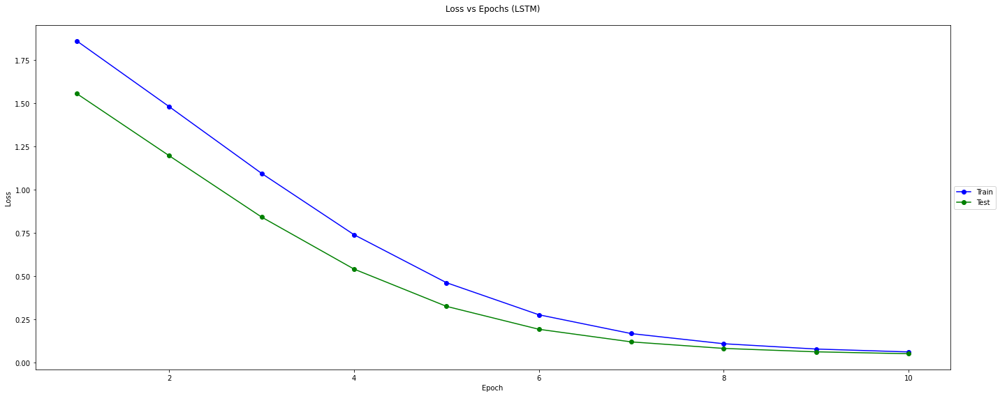

In [15]:
plot_multi_curves(epoch_list, [lstm_train_loss_list, lstm_test_loss_list], 'Epoch', 'Loss', ['Train', 'Test'], 'Loss vs Epochs (LSTM)')

## RNN

In [16]:
rnn_model = RNN(input_size=input_size, hidden_size=hidden_size, output_size=output_size)

# Use 1 for batch_size since the sequence length varies
#batch_size = 1

In [ ]:
opt_rnn = torch.optim.SGD(rnn_model.parameters(), lr = 0.00001)

rnn_train_loss_list, rnn_test_loss_list = train_supervised(rnn_model, train_loader, test_loader, opt_rnn, loss_func, epochs=epochs)

Train Epoch: 1/  10. Loss: 1.8716.: : 0it [00:35, ?it/s]
Test Iter:   93/7500. Loss: 0.9439.:   1%|   | 91/7500 [00:00<00:16, 458.12it/s]


Test Iter:  188/7500. Loss: 0.8420.:   2%|  | 185/7500 [00:00<00:16, 433.52it/s]


Test Iter:  284/7500. Loss: 0.8677.:   3%|  | 242/7500 [00:00<00:15, 479.76it/s]


Test Iter:  379/7500. Loss: 0.8284.:   5%|  | 341/7500 [00:00<00:14, 482.22it/s]


Test Iter:  474/7500. Loss: 0.8214.:   6%|  | 441/7500 [00:01<00:14, 483.29it/s]


Test Iter:  569/7500. Loss: 0.7982.:   7%|▏ | 539/7500 [00:01<00:14, 482.88it/s]


Test Iter:  664/7500. Loss: 0.7863.:   9%|▏ | 638/7500 [00:01<00:14, 479.14it/s]


Test Iter:  759/7500. Loss: 0.8295.:  10%|▏ | 740/7500 [00:01<00:13, 492.45it/s]


Test Iter:  826/7500. Loss: 0.8523.:  11%|▏ | 790/7500 [00:01<00:13, 489.73it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 1475/7500. Loss: 1.0063.:  19%|▏| 1453/7500 [00:02<00:09, 647.63it/s]


Test Iter: 1571/7500. Loss: 1.0010.:  20%|▏| 1522/7500 [00:02<00:09, 656.29it/s]


Test Iter: 1666/7500. Loss: 1.0035.:  22%|▏| 1657/7500 [00:03<00:09, 648.52it/s]


Test Iter: 1762/7500. Loss: 1.0066.:  23%|▏| 1722/7500 [00:03<00:09, 620.37it/s]


Test Iter: 1857/7500. Loss: 0.9876.:  25%|▏| 1844/7500 [00:03<00:10, 552.28it/s]


Test Iter: 1953/7500. Loss: 0.9728.:  25%|▎| 1900/7500 [00:03<00:10, 537.13it/s]


Test Iter: 2048/7500. Loss: 0.9697.:  27%|▎| 2008/7500 [00:03<00:10, 515.53it/s]


Test Iter: 2143/7500. Loss: 0.9825.:  28%|▎| 2112/7500 [00:04<00:10, 505.04it/s]


Test Iter: 2238/7500. Loss: 0.9745.:  30%|▎| 2215/7500 [00:04<00:10, 503.90it/s]


Test Iter: 2333/7500. Loss: 0.9766.:  31%|▎| 2316/7500 [00:04<00:10, 494.69it/s]


Test Iter: 2428/7500. Loss: 0.9889.:  32%|▎| 2418/7500 [00:04<00:10, 500.58it/s]


Test Iter: 2433/7500. Loss: 0.9876.:  32%|▎| 2418/7500 [00:04<00:10, 500.58it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 3171/7500. Loss: 1.0271.:  42%|▍| 3166/7500 [00:05<00:06, 645.63it/s]


Test Iter: 3267/7500. Loss: 1.0219.:  43%|▍| 3236/7500 [00:06<00:06, 659.08it/s]


Test Iter: 3363/7500. Loss: 1.0274.:  44%|▍| 3311/7500 [00:06<00:06, 686.05it/s]


Test Iter: 3458/7500. Loss: 1.0337.:  46%|▍| 3451/7500 [00:06<00:06, 665.81it/s]


Test Iter: 3554/7500. Loss: 1.0348.:  47%|▍| 3522/7500 [00:06<00:05, 677.50it/s]


Test Iter: 3650/7500. Loss: 1.0322.:  48%|▍| 3591/7500 [00:06<00:05, 656.06it/s]


Test Iter: 3745/7500. Loss: 1.0334.:  50%|▍| 3718/7500 [00:06<00:06, 575.80it/s]


Test Iter: 3840/7500. Loss: 1.0256.:  51%|▌| 3833/7500 [00:07<00:06, 528.15it/s]


Test Iter: 3936/7500. Loss: 1.0258.:  52%|▌| 3887/7500 [00:07<00:06, 519.12it/s]


Test Iter: 4031/7500. Loss: 1.0308.:  53%|▌| 3992/7500 [00:07<00:06, 512.85it/s]


Test Iter: 4069/7500. Loss: 1.0310.:  54%|▌| 4044/7500 [00:07<00:06, 505.92it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 4752/7500. Loss: 1.0366.:  63%|▋| 4705/7500 [00:08<00:05, 493.22it/s]


Test Iter: 4847/7500. Loss: 1.0319.:  64%|▋| 4828/7500 [00:09<00:04, 558.61it/s]


Test Iter: 4943/7500. Loss: 1.0327.:  65%|▋| 4889/7500 [00:09<00:04, 572.88it/s]


Test Iter: 5038/7500. Loss: 1.0321.:  67%|▋| 5021/7500 [00:09<00:04, 616.63it/s]


Test Iter: 5134/7500. Loss: 1.0315.:  68%|▋| 5091/7500 [00:09<00:03, 640.57it/s]


Test Iter: 5230/7500. Loss: 1.0374.:  69%|▋| 5159/7500 [00:09<00:03, 650.94it/s]


Test Iter: 5325/7500. Loss: 1.0398.:  71%|▋| 5300/7500 [00:09<00:03, 623.70it/s]


Test Iter: 5421/7500. Loss: 1.0424.:  72%|▋| 5369/7500 [00:09<00:03, 640.71it/s]


Test Iter: 5516/7500. Loss: 1.0343.:  73%|▋| 5509/7500 [00:10<00:02, 667.55it/s]


Test Iter: 5612/7500. Loss: 1.0376.:  74%|▋| 5577/7500 [00:10<00:03, 595.63it/s]


Test Iter: 5684/7500. Loss: 1.0364.:  75%|▊| 5639/7500 [00:10<00:03, 571.14it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 6352/7500. Loss: 1.0667.:  84%|▊| 6320/7500 [00:11<00:02, 493.82it/s]


Test Iter: 6447/7500. Loss: 1.0695.:  86%|▊| 6421/7500 [00:11<00:02, 488.54it/s]


Test Iter: 6542/7500. Loss: 1.0705.:  87%|▊| 6527/7500 [00:12<00:02, 472.58it/s]


Test Iter: 6637/7500. Loss: 1.0732.:  88%|▉| 6620/7500 [00:12<00:01, 440.18it/s]


Test Iter: 6733/7500. Loss: 1.0726.:  89%|▉| 6686/7500 [00:12<00:01, 501.30it/s]


Test Iter: 6828/7500. Loss: 1.0728.:  91%|▉| 6821/7500 [00:12<00:01, 583.48it/s]


Test Iter: 6924/7500. Loss: 1.0698.:  92%|▉| 6895/7500 [00:12<00:00, 627.53it/s]


Test Iter: 7020/7500. Loss: 1.0657.:  93%|▉| 6959/7500 [00:12<00:00, 627.30it/s]


Test Iter: 7115/7500. Loss: 1.0623.:  95%|▉| 7095/7500 [00:13<00:00, 652.73it/s]


Test Iter: 7211/7500. Loss: 1.0607.:  96%|▉| 7167/7500 [00:13<00:00, 671.19it/s]


Test Iter: 7306/7500. Loss: 1.0575.:  97%|▉| 7301/7500 [00:13<00:00, 653.43it/s]


Test Iter: 7316/7500. Loss: 1.0563.:  97%|▉| 7301/7500 [00:13<00:00, 653.43it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Train Epoch: 2/  10. Loss: 0.9729.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9713.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9696.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9764.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9751.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9735.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9730.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9767.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9756.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9739.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Los

Train Epoch: 2/  10. Loss: 0.9403.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9485.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9473.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9463.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9487.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9475.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9469.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9456.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9444.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9758.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9746.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9733.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9722.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9710.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9809.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9795.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9783.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.97

Train Epoch: 2/  10. Loss: 0.9984.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9972.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9960.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9948.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9938.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9925.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9914.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9904.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9987.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9977.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9967.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9956.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9944.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9934.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9922.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9911.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.9901.: : 0it [00:01, ?it/s]
Train Epoch: 2/  10. Loss: 0.98

Train Epoch: 2/  10. Loss: 0.9647.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9638.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9629.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9620.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9617.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9609.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9603.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9593.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9644.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9766.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9757.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9747.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9739.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9730.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9721.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9712.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.9702.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 0.96

Train Epoch: 2/  10. Loss: 1.0749.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0740.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0731.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0722.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0714.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0713.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0704.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0695.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0686.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0724.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0715.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0706.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0697.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0688.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0679.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0671.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0662.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.06

Train Epoch: 2/  10. Loss: 1.0561.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0552.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0545.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0543.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0535.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0628.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0621.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0613.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0606.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0598.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0591.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0642.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0700.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0692.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0735.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0727.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.0721.: : 0it [00:02, ?it/s]
Train Epoch: 2/  10. Loss: 1.07

Train Epoch: 2/  10. Loss: 1.0563.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0555.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0548.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0598.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0592.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0590.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0583.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0577.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0573.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0565.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0560.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0554.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0548.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0541.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0537.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0530.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0524.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.05

Train Epoch: 2/  10. Loss: 1.0511.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0505.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0541.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0534.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0528.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0523.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0520.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0519.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0513.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0507.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0539.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0533.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0533.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0526.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0526.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0520.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.0520.: : 0it [00:03, ?it/s]
Train Epoch: 2/  10. Loss: 1.05

Train Epoch: 2/  10. Loss: 1.0156.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0152.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0147.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0147.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0143.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0139.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0135.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0131.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0127.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0125.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0121.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0117.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0113.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0109.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0105.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0101.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0096.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.00

Train Epoch: 2/  10. Loss: 1.0111.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0107.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0128.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0124.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0120.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0116.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0112.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0108.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0121.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0117.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0116.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0112.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0109.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0105.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0101.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0098.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.0094.: : 0it [00:05, ?it/s]
Train Epoch: 2/  10. Loss: 1.01

Train Epoch: 2/  10. Loss: 1.0046.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0042.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0039.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0041.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0038.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0058.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0054.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0051.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0081.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0077.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0074.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0073.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0070.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0066.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0064.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0060.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.0057.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 1.00

Train Epoch: 2/  10. Loss: 0.9973.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9988.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9985.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9981.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9979.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9975.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9972.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9968.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9965.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9961.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9958.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9955.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9964.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9962.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9958.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9960.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9956.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.99

Train Epoch: 2/  10. Loss: 0.9824.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9820.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9817.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9814.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9811.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9808.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9805.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9802.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9799.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9796.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9792.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9789.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9786.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9783.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9801.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9798.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.9814.: : 0it [00:06, ?it/s]
Train Epoch: 2/  10. Loss: 0.98

Train Epoch: 2/  10. Loss: 0.9669.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9666.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9663.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9660.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9657.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9666.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9663.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9661.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9678.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9674.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9674.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9671.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9668.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9665.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9662.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9659.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9656.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.96

Train Epoch: 2/  10. Loss: 0.9583.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9580.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9577.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9575.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9571.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9569.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9566.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9563.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9560.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9557.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9554.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9551.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9549.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9546.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9544.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9544.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.9541.: : 0it [00:07, ?it/s]
Train Epoch: 2/  10. Loss: 0.95

Train Epoch: 2/  10. Loss: 0.9704.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9701.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9699.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9697.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9694.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9692.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9690.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9688.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9685.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9683.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9681.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9680.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9678.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9675.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9690.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9688.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9686.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.96

Train Epoch: 2/  10. Loss: 0.9537.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9546.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9544.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9542.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9539.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9555.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9561.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9559.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9576.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9573.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9571.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9569.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9567.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9565.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9562.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9560.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9558.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.95

Train Epoch: 2/  10. Loss: 0.9561.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9561.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9559.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9557.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9554.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9552.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9550.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9548.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9546.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9544.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9542.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9540.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9538.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9536.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9534.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9549.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.9547.: : 0it [00:09, ?it/s]
Train Epoch: 2/  10. Loss: 0.95

Train Epoch: 2/  10. Loss: 0.9509.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9507.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9505.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9503.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9501.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9527.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9525.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9524.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9522.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9520.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9531.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9529.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9527.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9528.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9526.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9524.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9522.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.95

Train Epoch: 2/  10. Loss: 0.9566.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9564.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9562.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9560.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9557.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9568.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9566.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9564.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9562.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9576.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9574.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9571.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9570.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9568.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9566.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9564.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9562.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.95

Train Epoch: 2/  10. Loss: 0.9516.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9525.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9523.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9525.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9523.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9521.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9519.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9520.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9518.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9518.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9528.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9527.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9525.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9539.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9537.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9535.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.9534.: : 0it [00:10, ?it/s]
Train Epoch: 2/  10. Loss: 0.95

Train Epoch: 2/  10. Loss: 0.9570.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9568.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9566.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9564.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9562.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9565.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9563.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9561.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9560.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9570.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9568.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9566.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9567.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9580.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9578.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9576.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9574.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.95

Train Epoch: 2/  10. Loss: 0.9623.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9621.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9620.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9618.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9617.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9616.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9614.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9612.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9623.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9621.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9626.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9625.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9623.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9621.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9619.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9617.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.9615.: : 0it [00:11, ?it/s]
Train Epoch: 2/  10. Loss: 0.96

Train Epoch: 2/  10. Loss: 0.9527.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9526.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9534.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9532.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9531.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9539.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9538.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9536.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9535.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9533.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9532.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9530.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9529.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9531.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9530.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9528.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.9527.: : 0it [00:12, ?it/s]
Train Epoch: 2/  10. Loss: 0.95

Train Epoch: 2/  10. Loss: 0.9538.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9536.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9535.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9533.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9532.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9530.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9529.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9527.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9525.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9524.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9523.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9521.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9520.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9518.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9529.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9527.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9529.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.95

Train Epoch: 2/  10. Loss: 0.9573.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9580.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9579.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9578.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9577.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9575.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9573.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9576.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9576.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9574.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9573.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9571.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9572.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9571.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9569.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9568.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9566.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.95

Train Epoch: 2/  10. Loss: 0.9543.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9542.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9540.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9539.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9546.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9544.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9543.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9542.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9542.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9541.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9539.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9537.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9536.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9534.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9533.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9550.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.9548.: : 0it [00:13, ?it/s]
Train Epoch: 2/  10. Loss: 0.95

Train Epoch: 2/  10. Loss: 0.9516.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9515.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9513.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9512.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9514.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9513.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9511.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9520.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9518.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9516.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9515.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9513.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9512.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9519.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9518.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9518.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9516.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.95

Train Epoch: 2/  10. Loss: 0.9475.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9473.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9472.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9470.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9475.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9473.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9472.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9473.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9482.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9488.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9487.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9485.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9484.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9482.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9481.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9479.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.9478.: : 0it [00:14, ?it/s]
Train Epoch: 2/  10. Loss: 0.94

Train Epoch: 2/  10. Loss: 0.9429.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9428.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9443.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9442.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9441.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9447.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9446.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9444.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9443.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9441.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9453.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9452.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9459.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9458.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9457.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9455.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.9471.: : 0it [00:15, ?it/s]
Train Epoch: 2/  10. Loss: 0.94

Train Epoch: 2/  10. Loss: 0.9354.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9352.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9351.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9350.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9349.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9349.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9348.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9346.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9345.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9344.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9351.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9350.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9349.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9347.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9346.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9345.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9343.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.93

Train Epoch: 2/  10. Loss: 0.9329.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9328.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9326.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9330.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9329.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9328.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9327.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9325.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9324.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9323.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9322.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9321.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9319.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9318.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9317.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9315.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.9314.: : 0it [00:16, ?it/s]
Train Epoch: 2/  10. Loss: 0.93

Train Epoch: 2/  10. Loss: 0.9289.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9288.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9287.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9286.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9284.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9283.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9282.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9280.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9279.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9278.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9279.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9278.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9277.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9276.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9275.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9273.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9272.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.92

Train Epoch: 2/  10. Loss: 0.9243.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9242.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9241.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9240.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9239.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9238.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9237.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9237.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9235.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9234.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9241.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9240.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9241.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9240.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9239.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9238.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9237.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.92

Train Epoch: 2/  10. Loss: 0.9195.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9200.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9199.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9198.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9196.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9195.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9194.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9193.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9191.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9190.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9189.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9188.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9187.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9185.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9184.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9183.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.9182.: : 0it [00:17, ?it/s]
Train Epoch: 2/  10. Loss: 0.91

Train Epoch: 2/  10. Loss: 0.9118.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9117.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9115.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9114.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9118.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9117.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9116.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9115.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9114.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9113.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9111.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9110.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9109.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9108.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9107.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9106.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9105.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.91

Train Epoch: 2/  10. Loss: 0.9077.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9076.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9075.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9073.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9072.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9071.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9076.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9075.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9074.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9078.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9077.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9076.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9075.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9074.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9072.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9071.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9070.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.90

Train Epoch: 2/  10. Loss: 0.9044.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9043.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9048.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9051.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9050.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9049.: : 0it [00:18, ?it/s]
Train Epoch: 2/  10. Loss: 0.9048.: : 0it [00:18, ?it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Train Epoch: 2/  10. Loss: 0.8969.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 0.8968.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 0.8971.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 0.8970.: : 0it [00:19, ?it/s]
Train Epoch: 2/  10. Loss: 0.8969.: : 0it [00:19

Train Epoch: 2/  10. Loss: 0.8969.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8968.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8967.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8972.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8971.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8970.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8969.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8968.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8966.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8965.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8964.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8963.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8962.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8961.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8960.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8959.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8958.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.89

Train Epoch: 2/  10. Loss: 0.8910.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8915.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8913.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8919.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8918.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8917.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8916.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8915.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8914.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8913.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8912.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8911.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8910.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8909.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8908.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8907.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8906.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.89

Train Epoch: 2/  10. Loss: 0.8855.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8854.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8853.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8852.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8851.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8850.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8851.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8850.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8849.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8848.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8851.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8850.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8857.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8856.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8855.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8854.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.8853.: : 0it [00:20, ?it/s]
Train Epoch: 2/  10. Loss: 0.88

Train Epoch: 2/  10. Loss: 0.8792.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8794.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8793.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8792.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8791.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8790.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8789.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8788.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8794.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8798.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8797.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8796.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8795.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8794.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8793.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8792.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8791.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.87

Train Epoch: 2/  10. Loss: 0.8771.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8770.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8775.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8774.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8773.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8772.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8772.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8776.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8775.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8774.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8773.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8777.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8776.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8775.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8781.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8780.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8779.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.87

Train Epoch: 2/  10. Loss: 0.8713.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8712.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8711.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8718.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8717.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8716.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8715.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8714.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8713.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8714.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8714.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8713.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8712.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8711.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8710.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8709.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.8708.: : 0it [00:21, ?it/s]
Train Epoch: 2/  10. Loss: 0.87

Train Epoch: 2/  10. Loss: 0.8709.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8708.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8707.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8706.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8705.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8704.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8703.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8702.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8701.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8701.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8700.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8699.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8698.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8697.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8696.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8695.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.8695.: : 0it [00:22, ?it/s]
Train Epoch: 2/  10. Loss: 0.86

Train Epoch: 2/  10. Loss: 0.8589.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8588.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8587.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8591.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8590.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8589.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8588.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8587.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8586.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8585.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8585.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8589.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8592.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8592.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8591.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8590.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8589.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.85

Train Epoch: 2/  10. Loss: 0.8569.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8568.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8567.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8571.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8576.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8575.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8575.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8579.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8578.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8577.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8576.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8575.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8575.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8574.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8578.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8581.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.8581.: : 0it [00:23, ?it/s]
Train Epoch: 2/  10. Loss: 0.85

Train Epoch: 2/  10. Loss: 0.8560.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8560.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8559.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8560.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8559.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8558.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8557.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8556.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8556.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8555.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8562.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8562.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8564.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8563.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8563.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8562.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8561.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.85

Train Epoch: 2/  10. Loss: 0.8550.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8549.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8548.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8547.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8546.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8546.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8545.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8544.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8547.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8547.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8546.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8547.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8546.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8546.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8545.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8544.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8543.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.85

Train Epoch: 2/  10. Loss: 0.8538.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8537.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8536.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8536.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8536.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8535.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8534.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8537.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8536.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8535.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8534.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8534.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8537.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8536.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8535.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8536.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.8535.: : 0it [00:24, ?it/s]
Train Epoch: 2/  10. Loss: 0.85

Train Epoch: 2/  10. Loss: 0.8515.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8515.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8514.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8515.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8514.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8513.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8512.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8511.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8511.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8514.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8513.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8512.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8511.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8511.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8510.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8509.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8508.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.85

Train Epoch: 2/  10. Loss: 0.8520.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8519.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8524.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8528.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8527.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8526.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8526.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8525.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8524.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8523.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8523.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8522.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8521.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8524.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8523.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8523.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.8522.: : 0it [00:25, ?it/s]
Train Epoch: 2/  10. Loss: 0.85

Train Epoch: 2/  10. Loss: 0.8438.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8438.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8437.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8436.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8435.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8435.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8434.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8437.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8437.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8436.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8435.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8434.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8437.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8436.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8436.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8435.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.8434.: : 0it [00:26, ?it/s]
Train Epoch: 2/  10. Loss: 0.84

Train Epoch: 2/  10. Loss: 0.8388.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8388.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8387.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8386.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8386.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8385.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8384.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8383.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8386.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8385.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8385.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8387.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8388.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8388.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8387.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8386.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8385.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.83

Train Epoch: 2/  10. Loss: 0.8391.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8390.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8390.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8389.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8388.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8387.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8387.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8386.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8385.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8385.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8384.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8383.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8382.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8383.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8382.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8381.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8381.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.83

Train Epoch: 2/  10. Loss: 0.8355.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8354.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8353.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8352.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8352.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8351.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8350.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8354.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8353.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8352.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8352.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8351.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8350.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8350.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8349.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8348.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.8349.: : 0it [00:27, ?it/s]
Train Epoch: 2/  10. Loss: 0.83

Train Epoch: 2/  10. Loss: 0.8338.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8338.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8337.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8336.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8336.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8335.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8334.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8333.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8333.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8332.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8332.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8332.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8331.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8331.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8330.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8329.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8331.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.83

Train Epoch: 2/  10. Loss: 0.8338.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8341.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8341.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8345.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8344.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8343.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8343.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8346.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8345.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8344.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8344.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8343.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8343.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8342.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8342.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8341.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8340.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.83

Train Epoch: 2/  10. Loss: 0.8335.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8334.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8337.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8336.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8336.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8335.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8334.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8334.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8333.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8332.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8332.: : 0it [00:28, ?it/s]
Train Epoch: 2/  10. Loss: 0.8335.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8334.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8333.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8333.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8335.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8334.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.83

Train Epoch: 2/  10. Loss: 0.8298.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8300.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8299.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8298.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8298.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8297.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8296.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8296.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8296.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8295.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8294.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8297.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8296.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8299.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8298.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8297.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.8299.: : 0it [00:29, ?it/s]
Train Epoch: 2/  10. Loss: 0.82

Train Epoch: 2/  10. Loss: 0.8160.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8160.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8159.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8159.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8158.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8160.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8159.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8159.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8158.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8157.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8157.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8156.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8156.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8158.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8157.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8157.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8156.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.81

Train Epoch: 2/  10. Loss: 0.8137.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8136.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8135.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8135.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8134.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8133.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8133.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8132.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8134.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8134.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8133.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8132.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8135.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8134.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8133.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8133.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.8132.: : 0it [00:30, ?it/s]
Train Epoch: 2/  10. Loss: 0.81

Train Epoch: 2/  10. Loss: 0.8123.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8123.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8122.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8121.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8121.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8120.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8119.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8119.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8118.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8118.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8117.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8116.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8116.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8115.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8115.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8117.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8116.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.81

Train Epoch: 2/  10. Loss: 0.8089.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8088.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8088.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8087.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8089.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8089.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8092.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8091.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8091.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8090.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8090.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8089.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8089.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8088.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8091.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8090.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8089.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.80

Train Epoch: 2/  10. Loss: 0.8039.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8039.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8038.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8037.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8037.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8037.: : 0it [00:31, ?it/s]
Train Epoch: 2/  10. Loss: 0.8037.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8036.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8035.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8035.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8034.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8034.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8033.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8035.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8035.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8034.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8033.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.80

Train Epoch: 2/  10. Loss: 0.8016.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8016.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8021.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8020.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8019.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8019.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8024.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8023.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8023.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8022.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8022.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8025.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8024.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8023.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8023.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8022.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.8022.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.80

Train Epoch: 2/  10. Loss: 0.8000.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7999.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7999.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7998.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7998.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7997.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7996.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7996.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7995.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7995.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7997.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7996.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7996.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7995.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7995.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7994.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.7994.: : 0it [00:32, ?it/s]
Train Epoch: 2/  10. Loss: 0.79

Train Epoch: 2/  10. Loss: 0.7882.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7884.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7884.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7883.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7885.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7887.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7887.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7886.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7886.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7885.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7885.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7884.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7885.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7885.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7884.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7884.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.7883.: : 0it [00:33, ?it/s]
Train Epoch: 2/  10. Loss: 0.78

Train Epoch: 2/  10. Loss: 0.7870.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7870.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7869.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7869.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7868.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7868.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7867.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7867.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7866.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7868.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7868.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7867.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7867.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7866.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7869.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7869.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7868.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.78

Train Epoch: 2/  10. Loss: 0.7845.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7845.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7844.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7844.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7846.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7846.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7845.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7845.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7844.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7844.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7843.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7843.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7842.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7845.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7845.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7844.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.7844.: : 0it [00:34, ?it/s]
Train Epoch: 2/  10. Loss: 0.78

Train Epoch: 2/  10. Loss: 0.7820.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7820.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7819.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7819.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7821.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7820.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7820.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7821.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7823.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7822.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7821.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7821.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7824.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7823.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7823.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7822.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7822.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.78

Train Epoch: 2/  10. Loss: 0.7804.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7804.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7803.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7803.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7802.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7802.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7802.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7802.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7801.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7801.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7800.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7802.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7802.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7801.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7801.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7800.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7800.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.77

Train Epoch: 2/  10. Loss: 0.7777.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7776.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7776.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7775.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7775.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7774.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7774.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7773.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7772.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7772.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7774.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7773.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7773.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7772.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7772.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7771.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.7771.: : 0it [00:35, ?it/s]
Train Epoch: 2/  10. Loss: 0.77

Train Epoch: 2/  10. Loss: 0.7749.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7748.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7751.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7750.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7752.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7751.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7751.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7753.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7753.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7752.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7752.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7752.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7751.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7751.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7750.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7750.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.7751.: : 0it [00:36, ?it/s]
Train Epoch: 2/  10. Loss: 0.77


Train Epoch: 2/  10. Loss: 0.7637.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7636.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7636.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7635.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7635.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7636.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7636.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7635.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7635.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7634.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7634.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7633.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7633.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7632.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7632.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7633.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7633.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7

Train Epoch: 2/  10. Loss: 0.7595.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7595.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7594.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7594.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7593.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7593.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7592.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7592.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7591.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7591.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7591.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7592.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7592.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7591.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7591.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7590.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.7590.: : 0it [00:37, ?it/s]
Train Epoch: 2/  10. Loss: 0.75

Train Epoch: 2/  10. Loss: 0.7575.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7575.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7574.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7574.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7573.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7573.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7572.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7572.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7571.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7571.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7570.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7570.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7570.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7569.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7571.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7570.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7570.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.75

Train Epoch: 2/  10. Loss: 0.7538.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7537.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7537.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7537.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7537.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7536.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7537.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7537.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7536.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7536.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7536.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7536.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7537.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7537.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7536.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7536.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7535.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.75

Train Epoch: 2/  10. Loss: 0.7522.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7522.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7523.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7522.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7522.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7521.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7521.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7521.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7520.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7520.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7519.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7519.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7518.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7518.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7519.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7521.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.7520.: : 0it [00:38, ?it/s]
Train Epoch: 2/  10. Loss: 0.75

Train Epoch: 2/  10. Loss: 0.7503.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7502.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7502.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7501.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7501.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7500.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7500.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7500.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7499.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7501.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7501.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7500.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7500.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7499.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7499.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7498.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7498.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.74

Train Epoch: 2/  10. Loss: 0.7486.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7485.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7485.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7484.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7484.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7484.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7483.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7483.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7482.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7482.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7481.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7481.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7482.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7485.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7484.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7484.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7483.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.74

Train Epoch: 2/  10. Loss: 0.7457.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7456.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7456.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7455.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7455.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7454.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7454.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7454.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7456.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7455.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7455.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7454.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7454.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7454.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7453.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7453.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.7452.: : 0it [00:39, ?it/s]
Train Epoch: 2/  10. Loss: 0.74

Train Epoch: 2/  10. Loss: 0.7375.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7375.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7374.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7374.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7373.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7373.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7373.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7372.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7372.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7371.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7371.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7370.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7370.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7369.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7369.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7369.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7368.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.73

Train Epoch: 2/  10. Loss: 0.7360.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7360.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7359.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7359.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7360.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7359.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7360.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7359.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7359.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7358.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7358.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7359.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7359.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7358.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7358.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7357.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7357.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.73

Train Epoch: 2/  10. Loss: 0.7331.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7330.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7330.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7330.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7329.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7330.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7330.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7329.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7329.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7329.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7328.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7328.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7327.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7327.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7326.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7326.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.7326.: : 0it [00:41, ?it/s]
Train Epoch: 2/  10. Loss: 0.73

Train Epoch: 2/  10. Loss: 0.7305.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7305.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7304.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7304.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7304.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7303.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7305.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7305.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7304.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7304.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7303.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7308.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7307.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7307.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7306.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7306.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7306.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.73

Train Epoch: 2/  10. Loss: 0.7277.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7276.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7276.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7276.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7275.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7275.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7274.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7274.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7274.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7273.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7274.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7274.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7273.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7273.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7277.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7277.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7278.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.72

Train Epoch: 2/  10. Loss: 0.7249.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7249.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7248.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7248.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7248.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7247.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7247.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7246.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7246.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7246.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7246.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7245.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7245.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7244.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7244.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7244.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.7243.: : 0it [00:42, ?it/s]
Train Epoch: 2/  10. Loss: 0.72

Train Epoch: 2/  10. Loss: 0.7217.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7217.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7217.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7216.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7216.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7215.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7215.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7215.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7214.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7214.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7213.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7213.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7213.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7212.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7212.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7211.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.7211.: : 0it [00:43, ?it/s]
Train Epoch: 2/  10. Loss: 0.72

Test Iter:  108/7500. Loss: 0.1646.:   1%|   | 71/7500 [00:00<00:19, 383.94it/s]


Test Iter:  203/7500. Loss: 0.1754.:   2%|  | 163/7500 [00:00<00:19, 379.32it/s]


Test Iter:  298/7500. Loss: 0.2034.:   3%|  | 262/7500 [00:00<00:16, 439.93it/s]


Test Iter:  393/7500. Loss: 0.1864.:   5%|  | 369/7500 [00:00<00:14, 486.47it/s]


Test Iter:  488/7500. Loss: 0.2087.:   6%|▏ | 471/7500 [00:01<00:14, 495.45it/s]


Test Iter:  583/7500. Loss: 0.2029.:   8%|▏ | 576/7500 [00:01<00:13, 506.42it/s]


Test Iter:  679/7500. Loss: 0.2102.:   8%|▏ | 628/7500 [00:01<00:13, 508.46it/s]


Test Iter:  774/7500. Loss: 0.2017.:  10%|▏ | 734/7500 [00:01<00:13, 508.98it/s]


Test Iter:  803/7500. Loss: 0.2010.:  11%|▏ | 788/7500 [00:01<00:13, 515.79it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 1545/7500. Loss: 0.1786.:  20%|▏| 1485/7500 [00:02<00:09, 645.66it/s]


Test Iter: 1640/7500. Loss: 0.1819.:  22%|▏| 1622/7500 [00:03<00:08, 658.01it/s]


Test Iter: 1736/7500. Loss: 0.1826.:  23%|▏| 1690/7500 [00:03<00:08, 663.90it/s]


Test Iter: 1831/7500. Loss: 0.1786.:  24%|▏| 1820/7500 [00:03<00:09, 581.63it/s]


Test Iter: 1927/7500. Loss: 0.1751.:  25%|▎| 1879/7500 [00:03<00:09, 580.31it/s]


Test Iter: 2022/7500. Loss: 0.1738.:  27%|▎| 1997/7500 [00:03<00:10, 545.38it/s]


Test Iter: 2117/7500. Loss: 0.1745.:  28%|▎| 2108/7500 [00:03<00:10, 534.78it/s]


Test Iter: 2213/7500. Loss: 0.1735.:  29%|▎| 2162/7500 [00:04<00:10, 530.21it/s]


Test Iter: 2308/7500. Loss: 0.1719.:  30%|▎| 2270/7500 [00:04<00:09, 527.31it/s]


Test Iter: 2403/7500. Loss: 0.1745.:  32%|▎| 2376/7500 [00:04<00:09, 519.78it/s]


Test Iter: 2466/7500. Loss: 0.1770.:  32%|▎| 2429/7500 [00:04<00:09, 520.54it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 3188/7500. Loss: 0.1739.:  42%|▍| 3119/7500 [00:05<00:07, 617.33it/s]


Test Iter: 3283/7500. Loss: 0.1734.:  43%|▍| 3255/7500 [00:05<00:06, 643.51it/s]


Test Iter: 3379/7500. Loss: 0.1707.:  44%|▍| 3330/7500 [00:06<00:06, 670.31it/s]


Test Iter: 3474/7500. Loss: 0.1729.:  46%|▍| 3472/7500 [00:06<00:05, 685.98it/s]


Test Iter: 3570/7500. Loss: 0.1731.:  47%|▍| 3541/7500 [00:06<00:05, 678.54it/s]


Test Iter: 3666/7500. Loss: 0.1725.:  48%|▍| 3609/7500 [00:06<00:05, 675.90it/s]


Test Iter: 3761/7500. Loss: 0.1732.:  50%|▌| 3754/7500 [00:06<00:05, 652.11it/s]


Test Iter: 3857/7500. Loss: 0.1728.:  51%|▌| 3820/7500 [00:06<00:06, 603.50it/s]


Test Iter: 3952/7500. Loss: 0.1736.:  53%|▌| 3942/7500 [00:07<00:06, 569.71it/s]


Test Iter: 4048/7500. Loss: 0.1749.:  53%|▌| 4000/7500 [00:07<00:06, 544.20it/s]


Test Iter: 4143/7500. Loss: 0.1737.:  55%|▌| 4110/7500 [00:07<00:06, 539.32it/s]


Test Iter: 4144/7500. Loss: 0.1741.:  55%|▌| 4110/7500 [00:07<00:06, 539.32it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Test Iter: 4910/7500. Loss: 0.1762.:  65%|▋| 4877/7500 [00:08<00:04, 524.97it/s]


Test Iter: 5005/7500. Loss: 0.1744.:  67%|▋| 5002/7500 [00:09<00:04, 575.34it/s]


Test Iter: 5101/7500. Loss: 0.1741.:  68%|▋| 5069/7500 [00:09<00:04, 603.42it/s]


Test Iter: 5197/7500. Loss: 0.1731.:  69%|▋| 5151/7500 [00:09<00:03, 667.01it/s]


Test Iter: 5292/7500. Loss: 0.1731.:  70%|▋| 5284/7500 [00:09<00:03, 650.75it/s]


Test Iter: 5388/7500. Loss: 0.1731.:  71%|▋| 5353/7500 [00:09<00:03, 662.13it/s]


Test Iter: 5484/7500. Loss: 0.1723.:  72%|▋| 5423/7500 [00:09<00:03, 672.06it/s]


Test Iter: 5579/7500. Loss: 0.1704.:  74%|▋| 5563/7500 [00:09<00:02, 675.71it/s]


Test Iter: 5675/7500. Loss: 0.1705.:  75%|▊| 5637/7500 [00:09<00:02, 692.95it/s]


Test Iter: 5771/7500. Loss: 0.1706.:  76%|▊| 5707/7500 [00:10<00:02, 687.26it/s]


Test Iter: 5805/7500. Loss: 0.1707.:  77%|▊| 5776/7500 [00:10<00:02, 628.09it/s]
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 6559/7500. Loss: 0.1730.:  87%|▊| 6555/7500 [00:11<00:01, 524.24it/s]


Test Iter: 6655/7500. Loss: 0.1755.:  88%|▉| 6608/7500 [00:11<00:01, 523.60it/s]


Test Iter: 6750/7500. Loss: 0.1755.:  90%|▉| 6716/7500 [00:12<00:01, 527.60it/s]


Test Iter: 6845/7500. Loss: 0.1760.:  91%|▉| 6822/7500 [00:12<00:01, 526.55it/s]


Test Iter: 6940/7500. Loss: 0.1754.:  93%|▉| 6939/7500 [00:12<00:01, 559.11it/s]


Test Iter: 7036/7500. Loss: 0.1758.:  93%|▉| 7007/7500 [00:12<00:00, 592.23it/s]


Test Iter: 7132/7500. Loss: 0.1771.:  94%|▉| 7081/7500 [00:12<00:00, 634.16it/s]


Test Iter: 7217/7500. Loss: 0.1775.:  95%|▉| 7151/7500 [00:12<00:00, 653.64it/s]

Test Iter: 7233/7500. Loss: 0.1778.:  96%|▉| 7217/7500 [00:12<00:00, 651.61it/s]


Test Iter: 7329/7500. Loss: 0.1773.:  97%|▉| 7286/7500 [00:12<00:00, 662.51it/s]


Test Iter: 7453/7500. Loss: 0.1777.:  99%|▉| 7428/7500 [00:13<00:00, 684.67it/s]


Test Iter: 7500/7500. Loss: 0.1773.: 100%|█| 7500/7500 [00:13<00:00, 568.93it/s]

Train Epoch: 3/  10. Loss: 0.2765.: : 0it [00:47, ?it/s]

Train Epoch: 4/  10. Loss: 0.0027.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.0127.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.0113.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.0134.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.0115.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.0108.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.0117.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.0113.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.0103.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.0131.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.0127.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.0120.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.0126.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.0126.: : 0it [00:00, ?it/s]
Train Epoch: 4/  10. Loss: 0.0118.: : 0it [00:00, ?it/s]
Train

Train Epoch: 4/  10. Loss: 0.1768.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1766.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1764.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1761.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1759.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1757.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1755.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1753.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1751.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1749.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1747.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1745.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1743.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1751.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1749.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1748.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.1750.: : 0it [00:01, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1691.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1690.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1688.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1686.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1684.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1683.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1681.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1680.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1675.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1673.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1672.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1670.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1668.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1667.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1870.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1879.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1877.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1876.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1874.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1873.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1891.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1889.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1888.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1886.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1884.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1883.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1881.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1879.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1877.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1876.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1874.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1889.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1887.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1886.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1884.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1883.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1882.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1880.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1879.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1888.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1886.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1885.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1892.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1890.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1889.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1887.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1886.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.1885.: : 0it [00:02, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1845.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1844.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1843.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1842.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1855.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1853.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1852.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1851.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1863.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1862.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1874.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1873.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1886.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1885.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1884.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1888.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1886.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1866.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1864.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1863.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1862.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1861.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1861.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1860.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1858.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1870.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1876.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1875.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1880.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1879.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1878.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1877.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1875.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1874.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1833.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1832.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1831.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1830.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1836.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1835.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1834.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1833.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1844.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1843.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1842.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1841.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1839.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1838.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1837.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1836.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.1835.: : 0it [00:03, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1785.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.1784.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.1783.: : 0it [00:04, ?it/s]
Train Epoch: 4/  10. Loss: 0.1783.: : 0it [00:04, ?it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Train Epoch: 4/  10. Loss: 0.1919.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.1918.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.1917.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.1917.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.1916.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.1915.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.1914.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.1914.: : 0it [00:05,

Train Epoch: 4/  10. Loss: 0.1931.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.1930.: : 0it [00:05, ?it/s]
Train Epoch: 4/  10. Loss: 0.1929.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1928.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1932.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1931.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1930.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1930.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1929.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1928.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1927.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1927.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1931.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1930.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1929.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1929.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1928.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.19

Train Epoch: 4/  10. Loss: 0.1913.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1913.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1912.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1912.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1911.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1910.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1910.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1909.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1908.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1908.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1907.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1907.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1906.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1905.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1905.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1904.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1904.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.19

Train Epoch: 4/  10. Loss: 0.1884.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1884.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1883.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1883.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1882.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1881.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1886.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1886.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1888.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1888.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1887.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1886.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1895.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1895.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1894.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1894.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.1893.: : 0it [00:06, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1897.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1897.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1902.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1901.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1901.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1900.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1900.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1899.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1898.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1898.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1897.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1897.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1896.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1896.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1895.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1894.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1894.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1874.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1873.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1873.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1872.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1872.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1875.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1875.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1882.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1881.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1881.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1880.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1880.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1879.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1878.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1878.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1877.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1877.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1854.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1856.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1855.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1855.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1859.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1859.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1864.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1868.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1867.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1867.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1871.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1871.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1875.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1874.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1874.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1873.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.1873.: : 0it [00:07, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1883.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1882.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1882.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1881.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1881.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1880.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1887.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1886.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1885.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1885.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1884.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1884.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1883.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1894.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1893.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1893.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.1893.: : 0it [00:08, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1883.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1882.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1883.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1883.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1883.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1882.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1882.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1885.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1884.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1884.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1884.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1883.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1883.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1882.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1882.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1882.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.1884.: : 0it [00:09, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1888.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1888.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1888.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1887.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1891.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1891.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1894.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1893.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1893.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1893.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1892.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1892.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1891.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1891.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1891.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1893.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1901.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.19

Train Epoch: 4/  10. Loss: 0.1893.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1892.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1894.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1895.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1895.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1894.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1894.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1894.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1893.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1893.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1898.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1898.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1897.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1897.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1897.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1896.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1896.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1885.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1885.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1885.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1884.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1889.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1888.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1888.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1887.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1890.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1890.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1889.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1889.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1888.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1888.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1888.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1887.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.1887.: : 0it [00:10, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1901.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1901.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1901.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1900.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1900.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1899.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1899.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1899.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1898.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1898.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1898.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1897.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1897.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1896.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1899.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1898.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1898.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1877.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1876.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1879.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1878.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1878.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1878.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1877.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1877.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1877.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1876.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1876.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1875.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1875.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1875.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1874.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1874.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1874.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1867.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1866.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1866.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1866.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1866.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1865.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1865.: : 0it [00:11, ?it/s]
Train Epoch: 4/  10. Loss: 0.1864.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.1864.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.1864.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.1863.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.1863.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.1863.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.1862.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.1862.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.1862.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.1861.: : 0it [00:12, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1839.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1839.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1838.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1838.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1838.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1838.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1837.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1838.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1838.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1837.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1839.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1839.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1839.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1838.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1838.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1838.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1838.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1823.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1824.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1824.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1824.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1824.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1826.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1826.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1825.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1825.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1825.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1824.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1824.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1824.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1823.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1823.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1823.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1822.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1813.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1813.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1813.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1813.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1815.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1815.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1815.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1815.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1815.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:13, ?it/s]
Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1806.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1806.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1804.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1804.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1804.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1803.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1803.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1807.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1807.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1806.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1806.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1806.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1813.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1813.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1813.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1813.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1812.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1814.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1813.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1813.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1813.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.1813.: : 0it [00:14, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1809.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1808.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1808.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1808.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1808.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1807.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1807.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1807.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1806.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1807.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1806.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1806.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1806.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1806.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1806.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1804.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1806.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1806.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1806.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1805.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1804.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1804.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1804.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.18

Train Epoch: 4/  10. Loss: 0.1793.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1793.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1792.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1792.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1792.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1792.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1791.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1791.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1791.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1791.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1790.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1790.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1790.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1791.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1790.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1790.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.1790.: : 0it [00:15, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1789.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.1789.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.1788.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.1788.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.1788.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.1788.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.1787.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.1787.: : 0it [00:16, ?it/s]
Train Epoch: 4/  10. Loss: 0.1787.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1787.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1787.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1786.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1786.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1786.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1786.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1786.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1785.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1786.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1786.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1786.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1785.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1785.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1785.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1785.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1784.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1784.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1784.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1785.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1785.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1785.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1786.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1786.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1785.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1785.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1796.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1796.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1796.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1795.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1795.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1795.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1795.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1795.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1794.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1794.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1794.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1794.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1794.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1793.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1793.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1793.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.1793.: : 0it [00:17, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1799.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1798.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1798.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1798.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1798.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1797.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1797.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1797.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1797.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1797.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1796.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1796.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1798.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1800.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1800.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1800.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1800.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1790.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1790.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1790.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1789.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1789.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1790.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1790.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1790.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1789.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1789.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1789.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1789.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1789.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1788.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1788.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1788.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1788.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1780.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1780.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1780.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1780.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1780.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1780.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1780.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1779.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1781.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1780.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1780.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1781.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1781.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1781.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1781.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1782.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.1782.: : 0it [00:18, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1768.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1767.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1767.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1767.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1767.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1768.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1768.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1768.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1767.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1767.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1767.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1767.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1766.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1766.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1766.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1766.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.1766.: : 0it [00:19, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1754.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1754.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1754.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1754.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1753.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1753.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1753.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1753.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1754.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1754.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1754.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1753.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1753.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1754.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1755.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1755.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1755.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1757.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1757.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1757.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1757.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1756.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1756.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1756.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1756.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1756.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1756.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1755.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1755.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1755.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1755.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1755.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1755.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.1754.: : 0it [00:20, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1745.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1745.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1745.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1746.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1746.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1746.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1746.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1746.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1745.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1745.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1745.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1745.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1745.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1745.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1744.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1744.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1744.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1743.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1742.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1742.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1744.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1744.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1744.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1743.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1743.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1744.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1744.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1744.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1744.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1743.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1743.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1743.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1743.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1743.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1738.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1738.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1738.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1741.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1741.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1740.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1740.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1740.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1740.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1740.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1742.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1741.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1741.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1741.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1741.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1741.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.1741.: : 0it [00:21, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1730.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1730.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1730.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1731.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1731.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1730.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1732.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1732.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1731.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1731.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1731.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1731.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1731.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1733.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1734.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1734.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1734.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1725.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1725.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1725.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1726.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1726.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.1726.: : 0it [00:22, ?it/s]
Train Epoch: 4/  10. Loss: 0.17


Train Epoch: 4/  10. Loss: 0.1722.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1722.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1722.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1722.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1722.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1721.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1721.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1721.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1721.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1721.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1721.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1721.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1721.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1721.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1721.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1721.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1721.: : 0it [00:23, ?it/s]
Train Epoch: 4/  10. Loss: 0.1

Train Epoch: 4/  10. Loss: 0.1729.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1729.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1729.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1729.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1729.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1729.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1728.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1728.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1728.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1729.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1729.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1729.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1729.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1729.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1729.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1729.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1729.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1732.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1732.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1732.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1732.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1732.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1732.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1732.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1731.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1731.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1731.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1731.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1731.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1732.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1732.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1732.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1732.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1731.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1725.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1725.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1725.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1725.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1724.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1723.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1723.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1723.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1723.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1723.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.1723.: : 0it [00:24, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1720.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1720.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1720.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1720.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1720.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1719.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1719.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1719.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1719.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1719.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1719.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1719.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1718.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1718.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1718.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1718.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1718.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1713.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1713.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1713.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1719.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1718.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1718.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1718.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1718.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1718.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1718.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1718.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1717.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1717.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1717.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1717.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1717.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1717.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1717.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1717.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.1717.: : 0it [00:25, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1710.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1710.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1710.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1710.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1710.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1710.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1710.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1709.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.1709.: : 0it [00:26, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1712.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1709.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1709.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1709.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1708.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1708.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1708.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1708.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1708.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1710.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1710.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1710.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.1711.: : 0it [00:27, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1706.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1706.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1706.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1706.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1706.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1706.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1706.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1706.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1706.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1705.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1705.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1705.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1705.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1705.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1705.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1705.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1706.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1705.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1707.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1707.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1707.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1707.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1706.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1707.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1707.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1708.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1708.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1708.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1708.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1708.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1708.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1707.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1707.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1707.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1703.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1704.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1704.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1704.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1704.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1704.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1704.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1705.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1704.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1704.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1704.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1704.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1704.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1704.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1704.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1704.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.1703.: : 0it [00:28, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1702.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1702.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1702.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1702.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1702.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1702.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1702.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1701.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1702.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1702.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1702.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1702.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1702.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1702.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1702.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1702.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1701.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.17

Train Epoch: 4/  10. Loss: 0.1697.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1696.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1696.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1696.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1697.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1696.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1698.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1698.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1698.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1698.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1698.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1698.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1699.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1699.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1699.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1698.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.1698.: : 0it [00:29, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1694.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1694.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1694.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1693.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1693.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1693.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1693.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1693.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1693.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1693.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1693.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1693.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1692.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1692.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1692.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1692.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.1692.: : 0it [00:30, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1687.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1687.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1687.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1687.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1687.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1688.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1688.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1687.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1687.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1687.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1687.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1687.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1687.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1687.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1687.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1687.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1687.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1686.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1686.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1686.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1686.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1686.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1685.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1685.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1685.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1685.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1685.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1685.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1685.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1685.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1685.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1685.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1685.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1685.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1681.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1681.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1681.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1681.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1681.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1681.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1681.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1681.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1681.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1680.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1680.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1680.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1680.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1680.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1680.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1680.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.1680.: : 0it [00:31, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1670.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1670.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1670.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1670.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1670.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1670.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1671.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1670.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1670.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1672.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1671.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1671.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1671.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1672.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1672.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1672.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1672.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1676.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1676.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1676.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1676.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1676.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1676.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1676.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1676.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:32, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1678.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1677.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.1676.: : 0it [00:33, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1655.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1654.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1654.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1656.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1656.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1656.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1656.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1656.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1656.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1656.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1656.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1655.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1655.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1656.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1656.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1656.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1656.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1663.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1662.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1663.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1663.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1663.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1664.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1663.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1663.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1664.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1664.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1664.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1664.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1664.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1665.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1666.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1666.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.1665.: : 0it [00:34, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1663.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1665.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1665.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1665.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1665.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1665.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1665.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1665.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1665.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1665.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1664.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1664.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1664.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1664.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1664.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1664.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1664.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1661.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1660.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1660.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1660.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1660.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1660.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1660.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1660.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1660.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1661.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1661.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1660.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1660.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1660.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1661.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1661.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1661.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1658.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1658.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1658.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1657.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1657.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1657.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1657.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1657.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1658.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1658.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1658.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1658.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1658.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1658.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1658.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1658.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.1658.: : 0it [00:35, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1652.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1651.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1651.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1651.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1651.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1651.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1651.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1651.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1651.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1651.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1651.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1651.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1651.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1651.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1651.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1651.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1650.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1648.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1646.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.1646.: : 0it [00:36, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1647.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1646.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.1646.: : 0it [00:37, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1645.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1645.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1645.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1645.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1645.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1644.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1645.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1645.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1645.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1645.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1645.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1645.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1645.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1644.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1644.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1644.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1644.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1641.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1641.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1641.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1642.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1642.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1642.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1642.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1642.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1642.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1642.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1642.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1642.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1642.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1642.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1642.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1642.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1642.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1640.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1640.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1640.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1640.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1640.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1640.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1640.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1639.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1639.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1639.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1639.: : 0it [00:38, ?it/s]
Train Epoch: 4/  10. Loss: 0.1639.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1639.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1639.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1639.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1639.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1639.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1638.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1638.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1638.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1638.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1638.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1638.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1638.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1638.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1638.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1637.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.1636.: : 0it [00:39, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1633.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1633.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1633.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1633.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1633.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1633.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1633.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1633.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1633.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1633.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1633.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1633.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1633.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1633.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1633.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1632.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.1632.: : 0it [00:40, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1623.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1623.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1624.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1624.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1623.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1624.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1624.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1624.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1624.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1624.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1624.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1624.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1624.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1623.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1623.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1623.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1623.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:41, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1619.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.1618.: : 0it [00:42, ?it/s]
Train Epoch: 4/  10. Loss: 0.16

Test Iter:  108/7500. Loss: 0.0692.:   1%|  | 105/7500 [00:00<00:14, 509.09it/s]


Test Iter:  204/7500. Loss: 0.0739.:   2%|  | 156/7500 [00:00<00:14, 504.25it/s]


Test Iter:  299/7500. Loss: 0.0801.:   3%|  | 259/7500 [00:00<00:14, 505.31it/s]


Test Iter:  394/7500. Loss: 0.0798.:   5%|  | 362/7500 [00:00<00:13, 510.30it/s]


Test Iter:  489/7500. Loss: 0.0796.:   6%|  | 466/7500 [00:00<00:13, 511.04it/s]


Test Iter:  584/7500. Loss: 0.0785.:   8%|▏ | 569/7500 [00:01<00:13, 508.69it/s]


Test Iter:  679/7500. Loss: 0.0779.:   9%|▏ | 673/7500 [00:01<00:13, 509.80it/s]


Test Iter:  772/7500. Loss: 0.0838.:  10%|▏ | 725/7500 [00:01<00:13, 512.15it/s]
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Test Iter: 1507/7500. Loss: 0.0895.:  20%|▏| 1468/7500 [00:02<00:09, 643.59it/s]


Test Iter: 1603/7500. Loss: 0.0875.:  20%|▏| 1537/7500 [00:02<00:09, 655.14it/s]


Test Iter: 1698/7500. Loss: 0.0887.:  22%|▏| 1678/7500 [00:03<00:08, 663.99it/s]


Test Iter: 1794/7500. Loss: 0.0889.:  23%|▏| 1745/7500 [00:03<00:09, 613.95it/s]


Test Iter: 1889/7500. Loss: 0.0889.:  25%|▏| 1868/7500 [00:03<00:10, 560.24it/s]


Test Iter: 1984/7500. Loss: 0.0912.:  26%|▎| 1980/7500 [00:03<00:10, 534.83it/s]


Test Iter: 2080/7500. Loss: 0.0930.:  27%|▎| 2034/7500 [00:03<00:10, 521.27it/s]


Test Iter: 2175/7500. Loss: 0.0949.:  29%|▎| 2140/7500 [00:03<00:10, 519.22it/s]


Test Iter: 2270/7500. Loss: 0.0973.:  30%|▎| 2247/7500 [00:04<00:10, 517.71it/s]


Test Iter: 2365/7500. Loss: 0.0968.:  31%|▎| 2352/7500 [00:04<00:09, 516.00it/s]


Test Iter: 2395/7500. Loss: 0.0980.:  31%|▎| 2352/7500 [00:04<00:09, 516.00it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 3137/7500. Loss: 0.0985.:  41%|▍| 3088/7500 [00:05<00:07, 627.76it/s]


Test Iter: 3232/7500. Loss: 0.0981.:  43%|▍| 3224/7500 [00:05<00:06, 651.96it/s]


Test Iter: 3328/7500. Loss: 0.0965.:  44%|▍| 3294/7500 [00:05<00:06, 664.65it/s]


Test Iter: 3424/7500. Loss: 0.0963.:  45%|▍| 3364/7500 [00:06<00:06, 672.10it/s]


Test Iter: 3519/7500. Loss: 0.0964.:  47%|▍| 3508/7500 [00:06<00:05, 685.60it/s]


Test Iter: 3615/7500. Loss: 0.0961.:  48%|▍| 3577/7500 [00:06<00:05, 665.52it/s]


Test Iter: 3711/7500. Loss: 0.0957.:  49%|▍| 3645/7500 [00:06<00:05, 668.99it/s]


Test Iter: 3806/7500. Loss: 0.0960.:  50%|▌| 3776/7500 [00:06<00:06, 595.15it/s]


Test Iter: 3901/7500. Loss: 0.0967.:  52%|▌| 3895/7500 [00:06<00:06, 550.08it/s]


Test Iter: 3997/7500. Loss: 0.0966.:  53%|▌| 3951/7500 [00:07<00:06, 544.71it/s]


Test Iter: 4060/7500. Loss: 0.0968.:  53%|▌| 4006/7500 [00:07<00:06, 531.26it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 4694/7500. Loss: 0.0972.:  63%|▋| 4693/7500 [00:08<00:05, 502.53it/s]


Test Iter: 4790/7500. Loss: 0.0967.:  63%|▋| 4744/7500 [00:08<00:05, 497.54it/s]


Test Iter: 4885/7500. Loss: 0.0970.:  65%|▋| 4854/7500 [00:08<00:05, 523.55it/s]


Test Iter: 4981/7500. Loss: 0.0962.:  66%|▋| 4930/7500 [00:08<00:04, 590.99it/s]


Test Iter: 5076/7500. Loss: 0.0961.:  67%|▋| 5060/7500 [00:09<00:04, 601.31it/s]


Test Iter: 5172/7500. Loss: 0.0966.:  68%|▋| 5121/7500 [00:09<00:04, 553.84it/s]


Test Iter: 5267/7500. Loss: 0.0962.:  70%|▋| 5244/7500 [00:09<00:04, 551.01it/s]


Test Iter: 5362/7500. Loss: 0.0962.:  71%|▋| 5357/7500 [00:09<00:03, 545.81it/s]


Test Iter: 5458/7500. Loss: 0.0966.:  72%|▋| 5413/7500 [00:09<00:04, 521.34it/s]


Test Iter: 5553/7500. Loss: 0.0961.:  74%|▋| 5531/7500 [00:10<00:03, 501.75it/s]


Test Iter: 5648/7500. Loss: 0.0956.:  75%|▊| 5630/7500 [00:10<00:04, 446.53it/s]


Test Iter: 5649/7500. Loss: 0.0956.:  75%|▊| 5630/7500 [00:10<00:04, 446.53it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 6299/7500. Loss: 0.0943.:  83%|▊| 6250/7500 [00:11<00:02, 483.76it/s]


Test Iter: 6394/7500. Loss: 0.0943.:  85%|▊| 6351/7500 [00:11<00:02, 484.76it/s]


Test Iter: 6489/7500. Loss: 0.0944.:  86%|▊| 6453/7500 [00:12<00:02, 494.26it/s]


Test Iter: 6584/7500. Loss: 0.0943.:  87%|▊| 6550/7500 [00:12<00:02, 446.51it/s]


Test Iter: 6679/7500. Loss: 0.0951.:  89%|▉| 6654/7500 [00:12<00:01, 482.53it/s]


Test Iter: 6774/7500. Loss: 0.0954.:  90%|▉| 6769/7500 [00:12<00:01, 527.58it/s]


Test Iter: 6870/7500. Loss: 0.0957.:  91%|▉| 6833/7500 [00:12<00:01, 558.84it/s]


Test Iter: 6965/7500. Loss: 0.0956.:  93%|▉| 6954/7500 [00:12<00:00, 577.47it/s]


Test Iter: 7061/7500. Loss: 0.0956.:  94%|▉| 7014/7500 [00:13<00:00, 582.54it/s]


Test Iter: 7156/7500. Loss: 0.0957.:  95%|▉| 7150/7500 [00:13<00:00, 606.65it/s]


Test Iter: 7191/7500. Loss: 0.0953.:  95%|▉| 7150/7500 [00:13<00:00, 606.65it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Train Epoch: 6/  10. Loss: 0.0906.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.0904.: : 0it [00:00, ?it/s]
Train Epoch: 6/  10. Loss: 0.0903.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0902.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0916.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0915.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0913.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0930.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0928.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0926.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Los

Train Epoch: 6/  10. Loss: 0.0998.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0996.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0996.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0994.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.1004.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.1003.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.1001.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0999.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0997.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0997.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0995.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0994.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0992.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0990.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0989.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0987.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0986.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0960.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0957.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0956.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0955.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0954.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0953.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0949.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0948.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0948.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0946.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0985.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0985.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0983.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0983.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.1005.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.1004.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.1003.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.1003.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.1002.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.1001.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0999.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0998.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0997.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.0996.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.1019.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.1017.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.1016.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.1015.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.1014.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.1013.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.1016.: : 0it [00:01, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.0985.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0984.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0984.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0983.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0980.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0979.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0977.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0991.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0990.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0989.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0988.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.0987.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.1058.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1057.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1057.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1056.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1055.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1054.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1054.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1053.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1052.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1051.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1051.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1050.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1058.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1057.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1056.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1056.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1055.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1065.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1065.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1064.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1063.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1063.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1062.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1061.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1060.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1059.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1059.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1058.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1057.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1057.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1056.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1059.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1058.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.1057.: : 0it [00:02, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1067.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1066.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1065.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1065.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1064.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1063.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1062.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1062.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1061.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1063.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1062.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1061.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1065.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1065.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1064.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1063.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1063.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1056.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1055.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1054.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1054.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1053.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1052.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1052.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1051.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1050.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1050.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1049.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1053.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1053.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1052.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1051.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1051.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1050.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1025.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1025.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1024.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1024.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1023.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1023.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1022.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1022.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1021.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1020.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1020.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1019.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1019.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1018.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1018.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1018.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.1018.: : 0it [00:03, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.0992.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0992.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0991.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0991.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0991.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0991.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0995.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0994.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0994.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0993.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0993.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0992.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0992.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0994.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0999.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0999.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0998.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.1019.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1018.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1018.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1017.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1017.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1016.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1016.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1015.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1015.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1014.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1016.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1015.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1015.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1015.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1014.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1014.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.1013.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.0991.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0991.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0990.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0990.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0990.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0989.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0989.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0989.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0988.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0988.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0989.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0994.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0993.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0993.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0992.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0992.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.0992.: : 0it [00:04, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.1025.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1029.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1033.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1032.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1032.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1032.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1031.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1031.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1031.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1030.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1030.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1029.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1029.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1029.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1028.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1028.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1028.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1006.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1005.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1005.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1005.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1005.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1004.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1004.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1003.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1003.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1007.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1007.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1007.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1007.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1006.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1006.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1006.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.1005.: : 0it [00:05, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1061.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1060.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1060.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1060.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1059.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1059.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1059.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1059.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1059.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1058.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1058.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1060.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1059.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1059.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1061.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1061.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1060.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1058.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1058.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1057.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1057.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1058.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1058.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1057.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1057.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1058.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1058.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1058.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1057.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1057.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1057.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1057.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1056.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.1056.: : 0it [00:07, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1075.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1075.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1074.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1074.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1074.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1073.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1073.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1074.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1074.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1074.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1074.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1074.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1075.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1074.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1074.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1074.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1074.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1076.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1075.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1075.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1075.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1077.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1077.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1076.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1079.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1078.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1078.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1078.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1077.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1077.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1077.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1077.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1077.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1080.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1090.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1090.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1090.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1090.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1090.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1090.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1090.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1089.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1089.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1089.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1089.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1089.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1091.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1090.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1093.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1095.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1094.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1097.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1096.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1096.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1096.: : 0it [00:08, ?it/s]
Train Epoch: 6/  10. Loss: 0.1096.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1095.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1095.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1095.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1095.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1094.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1094.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1094.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1093.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1093.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1093.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1093.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1093.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1080.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1079.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1079.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1079.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1079.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1078.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1078.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1078.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1078.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1077.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1077.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1077.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1077.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1077.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1076.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1076.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.1076.: : 0it [00:09, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1034.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1033.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1033.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1033.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1033.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1033.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1032.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1032.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1032.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1032.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1032.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1031.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1031.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1031.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1033.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1033.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1033.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1036.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1036.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1036.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1036.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1036.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1036.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1036.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1035.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1035.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1035.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1035.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1035.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1035.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1035.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1035.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1034.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1034.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1022.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1022.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1022.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1022.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1021.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1021.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1021.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1021.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1021.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1021.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1021.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1021.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1021.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1020.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1020.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1020.: : 0it [00:11, ?it/s]
Train Epoch: 6/  10. Loss: 0.1020.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1012.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1012.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1017.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1017.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1017.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1017.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1016.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1016.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1016.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1016.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1016.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1016.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1015.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1015.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1014.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1014.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1013.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1013.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1013.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1013.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1013.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1012.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1012.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1012.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1012.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1013.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1013.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1012.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1012.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1012.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.1012.: : 0it [00:12, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1011.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1011.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1011.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1010.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1010.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1011.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1010.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1010.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1010.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1010.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1010.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1010.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1008.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1008.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1008.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1009.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1008.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1008.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1008.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.1004.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1004.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1004.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1005.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1005.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1007.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1007.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1008.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1008.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1008.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1008.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1008.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1008.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1008.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1008.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1007.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.1007.: : 0it [00:13, ?it/s]
Train Epoch: 6/  10. Loss: 0.10

Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0984.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0984.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0984.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0983.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0983.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.0983.: : 0it [00:15, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0984.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0984.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0984.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0984.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0984.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0984.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0983.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0983.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0983.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0983.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0983.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0983.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0983.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0983.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0982.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0981.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0980.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0980.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0976.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0976.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:16, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0965.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0965.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0965.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0965.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0965.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0965.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0965.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0965.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0965.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0965.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0965.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:17, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:18, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0961.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0961.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0962.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0962.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0962.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0962.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0962.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0961.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0962.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0963.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0963.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0963.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0963.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0963.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:19, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:20, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:21, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:21, ?it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:22

Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:22, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:23, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0965.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0965.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0964.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0965.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:24, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:25, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:26, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0972.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.0975.: : 0it [00:27, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0978.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0974.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.0973.: : 0it [00:28, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0971.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.0970.: : 0it [00:29, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0969.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.0968.: : 0it [00:30, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0967.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0966.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0965.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0962.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0962.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0962.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0962.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0962.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0962.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0962.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0962.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0961.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0961.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0961.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0961.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0961.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0961.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0961.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0961.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0961.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.0957.: : 0it [00:31, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0957.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0957.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0957.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0957.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0957.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0957.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0957.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0957.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0957.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0957.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0957.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.0958.: : 0it [00:32, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0949.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0949.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0949.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0949.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.0949.: : 0it [00:33, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0946.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0946.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0946.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0946.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0947.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0946.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0946.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0946.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0946.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0947.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0947.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0947.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0947.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0947.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0946.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0946.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0946.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0950.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0953.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:34, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0952.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.0951.: : 0it [00:35, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.0945.: : 0it [00:36, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0943.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0943.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0943.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0943.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0943.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0943.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0943.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0943.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0943.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0943.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0943.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0943.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:37, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0940.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.0939.: : 0it [00:38, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0942.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.0941.: : 0it [00:40, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0938.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0935.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0935.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0935.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0935.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0935.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0934.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0935.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0934.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0934.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0934.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0934.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0934.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0934.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0934.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0934.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0934.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0934.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0933.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0933.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0933.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0933.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0933.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0933.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0933.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0933.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:41, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0933.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0933.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0933.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0933.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0933.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0933.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0933.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0932.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Train Epoch: 6/  10. Loss: 0.0931.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0931.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0931.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0931.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0931.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0931.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0930.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0930.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0930.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0930.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0930.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0930.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0930.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0930.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0930.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0930.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.0930.: : 0it [00:42, ?it/s]
Train Epoch: 6/  10. Loss: 0.09

Test Iter:  141/7500. Loss: 0.0946.:   1%|  | 102/7500 [00:00<00:14, 499.97it/s]


Test Iter:  236/7500. Loss: 0.1018.:   3%|  | 205/7500 [00:00<00:14, 503.60it/s]


Test Iter:  331/7500. Loss: 0.0909.:   4%|  | 317/7500 [00:00<00:13, 529.92it/s]


Test Iter:  426/7500. Loss: 0.0815.:   6%|  | 422/7500 [00:00<00:13, 516.46it/s]


Test Iter:  522/7500. Loss: 0.0730.:   6%|▏ | 474/7500 [00:01<00:13, 512.49it/s]


Test Iter:  617/7500. Loss: 0.0698.:   8%|▏ | 579/7500 [00:01<00:13, 514.52it/s]


Test Iter:  712/7500. Loss: 0.0673.:   9%|▏ | 684/7500 [00:01<00:13, 510.87it/s]


Test Iter:  792/7500. Loss: 0.0676.:  11%|▏ | 788/7500 [00:01<00:13, 511.04it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 1463/7500. Loss: 0.0588.:  19%|▏| 1402/7500 [00:02<00:09, 637.94it/s]


Test Iter: 1558/7500. Loss: 0.0605.:  20%|▏| 1537/7500 [00:02<00:09, 652.81it/s]


Test Iter: 1654/7500. Loss: 0.0623.:  21%|▏| 1604/7500 [00:02<00:08, 656.20it/s]


Test Iter: 1749/7500. Loss: 0.0626.:  23%|▏| 1741/7500 [00:03<00:08, 669.39it/s]


Test Iter: 1845/7500. Loss: 0.0619.:  24%|▏| 1808/7500 [00:03<00:09, 609.24it/s]


Test Iter: 1940/7500. Loss: 0.0600.:  26%|▎| 1929/7500 [00:03<00:10, 553.09it/s]


Test Iter: 2036/7500. Loss: 0.0585.:  26%|▎| 1986/7500 [00:03<00:10, 546.03it/s]


Test Iter: 2131/7500. Loss: 0.0594.:  28%|▎| 2097/7500 [00:03<00:10, 539.01it/s]


Test Iter: 2226/7500. Loss: 0.0586.:  29%|▎| 2205/7500 [00:03<00:10, 528.00it/s]


Test Iter: 2321/7500. Loss: 0.0593.:  31%|▎| 2312/7500 [00:04<00:09, 524.43it/s]


Test Iter: 2417/7500. Loss: 0.0593.:  32%|▎| 2366/7500 [00:04<00:09, 526.35it/s]


Test Iter: 2435/7500. Loss: 0.0594.:  32%|▎| 2419/7500 [00:04<00:09, 519.71it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 3178/7500. Loss: 0.0610.:  41%|▍| 3108/7500 [00:05<00:06, 629.57it/s]


Test Iter: 3273/7500. Loss: 0.0614.:  43%|▍| 3247/7500 [00:05<00:06, 644.58it/s]


Test Iter: 3369/7500. Loss: 0.0618.:  44%|▍| 3319/7500 [00:05<00:06, 665.72it/s]


Test Iter: 3464/7500. Loss: 0.0622.:  46%|▍| 3459/7500 [00:06<00:05, 677.20it/s]


Test Iter: 3560/7500. Loss: 0.0622.:  47%|▍| 3527/7500 [00:06<00:05, 668.80it/s]


Test Iter: 3656/7500. Loss: 0.0625.:  48%|▍| 3597/7500 [00:06<00:05, 675.94it/s]


Test Iter: 3751/7500. Loss: 0.0618.:  50%|▍| 3741/7500 [00:06<00:05, 649.42it/s]


Test Iter: 3847/7500. Loss: 0.0611.:  51%|▌| 3807/7500 [00:06<00:06, 614.10it/s]


Test Iter: 3942/7500. Loss: 0.0609.:  52%|▌| 3929/7500 [00:06<00:06, 566.08it/s]


Test Iter: 4038/7500. Loss: 0.0605.:  53%|▌| 3987/7500 [00:07<00:06, 557.06it/s]


Test Iter: 4090/7500. Loss: 0.0607.:  54%|▌| 4043/7500 [00:07<00:06, 550.45it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 4821/7500. Loss: 0.0612.:  64%|▋| 4797/7500 [00:08<00:05, 518.23it/s]


Test Iter: 4916/7500. Loss: 0.0612.:  65%|▋| 4908/7500 [00:08<00:04, 535.69it/s]


Test Iter: 5012/7500. Loss: 0.0614.:  66%|▋| 4973/7500 [00:08<00:04, 569.21it/s]


Test Iter: 5108/7500. Loss: 0.0617.:  67%|▋| 5045/7500 [00:09<00:04, 609.33it/s]


Test Iter: 5203/7500. Loss: 0.0617.:  69%|▋| 5186/7500 [00:09<00:03, 658.42it/s]


Test Iter: 5299/7500. Loss: 0.0627.:  70%|▋| 5252/7500 [00:09<00:03, 653.36it/s]


Test Iter: 5394/7500. Loss: 0.0628.:  72%|▋| 5392/7500 [00:09<00:03, 673.62it/s]


Test Iter: 5490/7500. Loss: 0.0628.:  73%|▋| 5461/7500 [00:09<00:03, 676.52it/s]


Test Iter: 5586/7500. Loss: 0.0626.:  74%|▋| 5529/7500 [00:09<00:02, 676.76it/s]


Test Iter: 5681/7500. Loss: 0.0630.:  76%|▊| 5669/7500 [00:09<00:02, 688.29it/s]


Test Iter: 5767/7500. Loss: 0.0626.:  77%|▊| 5738/7500 [00:10<00:02, 678.37it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Test Iter: 6487/7500. Loss: 0.0618.:  86%|▊| 6483/7500 [00:11<00:01, 521.79it/s]


Test Iter: 6583/7500. Loss: 0.0615.:  87%|▊| 6536/7500 [00:11<00:01, 523.23it/s]


Test Iter: 6678/7500. Loss: 0.0615.:  89%|▉| 6642/7500 [00:11<00:01, 524.53it/s]


Test Iter: 6773/7500. Loss: 0.0619.:  90%|▉| 6752/7500 [00:11<00:01, 533.78it/s]


Test Iter: 6868/7500. Loss: 0.0620.:  92%|▉| 6865/7500 [00:12<00:01, 545.57it/s]


Test Iter: 6982/7500. Loss: 0.0621.:  92%|▉| 6920/7500 [00:12<00:01, 531.64it/s]


Test Iter: 7077/7500. Loss: 0.0618.:  94%|▉| 7056/7500 [00:12<00:00, 604.76it/s]


Test Iter: 7192/7500. Loss: 0.0618.:  96%|▉| 7187/7500 [00:12<00:00, 625.07it/s]


Test Iter: 7288/7500. Loss: 0.0617.:  97%|▉| 7259/7500 [00:12<00:00, 650.94it/s]


Test Iter: 7411/7500. Loss: 0.0616.:  99%|▉| 7396/7500 [00:12<00:00, 665.40it/s]


Test Iter: 7500/7500. Loss: 0.0618.: 100%|█| 7500/7500 [00:13<00:00, 574.26it/s]

Train Epoch: 7/  10. Loss: 0.0745.: : 0it [00:46, ?it/s]

Train Epoch: 8/  10. Loss: 0.0036.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0060.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0043.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0055.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0050.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0112.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0160.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0146.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0133.: : 0it [00:00, ?it/s]


Train Epoch: 8/  10. Loss: 0.0128.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0140.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0132.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0127.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0121.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0115.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0112.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0361.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0341.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0331.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0315.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0311.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0305.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0551.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0532.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0524.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.0516.: : 0it [00:00, ?it/s]
Train Epoch: 8/  10. Loss: 0.05

Train Epoch: 8/  10. Loss: 0.0660.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0660.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0660.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0659.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0659.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0658.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0657.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0657.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0656.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0654.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0653.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0653.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0651.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0640.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0641.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0653.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0654.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0656.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0656.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0659.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0659.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0658.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0658.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0657.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0657.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0656.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0656.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0640.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0640.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0640.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0639.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0639.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0643.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0643.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0645.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0645.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0645.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0644.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0644.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0643.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0643.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0642.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:02, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0651.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0647.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0647.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0647.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0647.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0643.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0643.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0642.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0642.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0642.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0642.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0642.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0644.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0643.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0657.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0657.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0660.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0662.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0665.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0665.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0664.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.0664.: : 0it [00:03, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0684.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0686.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0688.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0688.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0691.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0690.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0690.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0690.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0690.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0690.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0689.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0691.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0693.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0693.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0693.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0693.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.0693.: : 0it [00:05, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0690.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0690.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0689.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0689.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0689.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0689.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0689.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0688.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0688.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0688.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0688.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0688.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0688.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0687.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0687.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0687.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0687.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0684.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0684.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0684.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0684.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0684.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0683.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0683.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0683.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0683.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0683.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0683.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0683.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0683.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0683.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0684.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0684.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0684.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0677.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0677.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0677.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0676.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0677.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0677.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0679.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0679.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0684.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0684.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0684.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0684.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0683.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0683.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0683.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0683.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.0683.: : 0it [00:06, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0678.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0678.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0677.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0677.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0677.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0677.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0677.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0677.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0677.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0677.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0676.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0677.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0676.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0676.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0676.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0676.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0676.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0667.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0667.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0666.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0666.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0666.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0666.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0666.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0667.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0667.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0667.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0667.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0666.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0666.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0666.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0666.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0666.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0666.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0651.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0651.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0651.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:07, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0656.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0656.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0655.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0656.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.0656.: : 0it [00:09, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0650.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0649.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0651.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0651.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0651.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.0651.: : 0it [00:10, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0653.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0653.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0653.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0652.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0647.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0647.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0647.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0647.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0647.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0647.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0647.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0647.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0647.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0647.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0648.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0643.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0643.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0643.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0643.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0643.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0642.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0642.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0642.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0642.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0642.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0642.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0642.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0642.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0642.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0641.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0641.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.0641.: : 0it [00:11, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:12, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:13, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0630.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:14, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:15, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0613.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0613.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0613.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0613.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0613.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:16, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0617.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:17, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:18, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:19, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:19, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:19, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:19, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:19, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:19, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:19, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:19, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:19, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:19, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:19, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:19, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:19, ?it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_l

Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0628.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0627.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:20, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0636.: : 0it [00:21, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:22, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:23, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:24, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0631.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0633.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:25, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:26, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:26, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:26, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:26, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:26, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:26, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:26, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:26, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:26, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:26, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:26, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:26, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:27, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0638.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0637.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0635.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0634.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.0632.: : 0it [00:28, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0629.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0626.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:29, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:31, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0625.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.0624.: : 0it [00:32, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.0623.: : 0it [00:33, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.0622.: : 0it [00:34, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0621.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:35, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0620.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0619.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:36, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:36, ?it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:37, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:37, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:37, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:37, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:37, ?it/s]
Train Epoch: 8/  10. Loss: 0.0618.: : 0it [00:37

Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:38, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0613.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.0614.: : 0it [00:39, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0615.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.0616.: : 0it [00:40, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Train Epoch: 8/  10. Loss: 0.0612.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0612.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0612.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0612.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0612.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0612.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0612.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0611.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0611.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0611.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0611.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0611.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0611.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0611.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0611.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0611.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.0611.: : 0it [00:41, ?it/s]
Train Epoch: 8/  10. Loss: 0.06

Test Iter:  134/7500. Loss: 0.0390.:   2%|  | 132/7500 [00:00<00:16, 458.56it/s]


Test Iter:  230/7500. Loss: 0.0387.:   3%|  | 188/7500 [00:00<00:14, 496.90it/s]


Test Iter:  325/7500. Loss: 0.0380.:   4%|  | 292/7500 [00:00<00:14, 507.32it/s]


Test Iter:  420/7500. Loss: 0.0402.:   5%|  | 396/7500 [00:00<00:13, 512.64it/s]


Test Iter:  515/7500. Loss: 0.0376.:   7%|▏ | 501/7500 [00:01<00:13, 515.07it/s]


Test Iter:  610/7500. Loss: 0.0350.:   8%|▏ | 610/7500 [00:01<00:13, 515.72it/s]


Test Iter:  706/7500. Loss: 0.0375.:   9%|▏ | 663/7500 [00:01<00:13, 516.47it/s]


Test Iter:  794/7500. Loss: 0.0389.:  10%|▏ | 769/7500 [00:01<00:12, 518.13it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 1479/7500. Loss: 0.0424.:  19%|▏| 1448/7500 [00:02<00:09, 638.50it/s]


Test Iter: 1575/7500. Loss: 0.0410.:  20%|▏| 1519/7500 [00:02<00:09, 657.50it/s]


Test Iter: 1670/7500. Loss: 0.0424.:  22%|▏| 1653/7500 [00:02<00:08, 656.09it/s]


Test Iter: 1766/7500. Loss: 0.0427.:  23%|▏| 1726/7500 [00:03<00:08, 676.53it/s]


Test Iter: 1861/7500. Loss: 0.0418.:  25%|▏| 1858/7500 [00:03<00:09, 592.22it/s]


Test Iter: 1957/7500. Loss: 0.0429.:  26%|▎| 1919/7500 [00:03<00:09, 572.63it/s]


Test Iter: 2052/7500. Loss: 0.0429.:  27%|▎| 2034/7500 [00:03<00:09, 550.55it/s]


Test Iter: 2147/7500. Loss: 0.0430.:  29%|▎| 2145/7500 [00:03<00:10, 534.77it/s]


Test Iter: 2243/7500. Loss: 0.0445.:  29%|▎| 2199/7500 [00:04<00:09, 531.48it/s]


Test Iter: 2338/7500. Loss: 0.0449.:  31%|▎| 2307/7500 [00:04<00:09, 528.61it/s]


Test Iter: 2433/7500. Loss: 0.0456.:  32%|▎| 2413/7500 [00:04<00:09, 525.71it/s]


Test Iter: 2460/7500. Loss: 0.0455.:  32%|▎| 2413/7500 [00:04<00:09, 525.71it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 3212/7500. Loss: 0.0462.:  42%|▍| 3153/7500 [00:05<00:07, 610.86it/s]


Test Iter: 3307/7500. Loss: 0.0465.:  44%|▍| 3290/7500 [00:05<00:06, 645.87it/s]


Test Iter: 3403/7500. Loss: 0.0464.:  45%|▍| 3359/7500 [00:06<00:06, 658.23it/s]


Test Iter: 3499/7500. Loss: 0.0465.:  46%|▍| 3434/7500 [00:06<00:05, 685.09it/s]


Test Iter: 3594/7500. Loss: 0.0468.:  48%|▍| 3573/7500 [00:06<00:05, 676.22it/s]


Test Iter: 3690/7500. Loss: 0.0466.:  49%|▍| 3644/7500 [00:06<00:05, 684.65it/s]


Test Iter: 3785/7500. Loss: 0.0467.:  50%|▌| 3781/7500 [00:06<00:05, 656.55it/s]


Test Iter: 3881/7500. Loss: 0.0463.:  51%|▌| 3847/7500 [00:06<00:05, 609.42it/s]


Test Iter: 3976/7500. Loss: 0.0463.:  53%|▌| 3968/7500 [00:07<00:06, 561.96it/s]


Test Iter: 4072/7500. Loss: 0.0460.:  54%|▌| 4025/7500 [00:07<00:06, 551.63it/s]


Test Iter: 4132/7500. Loss: 0.0464.:  54%|▌| 4081/7500 [00:07<00:06, 535.39it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


Test Iter: 4816/7500. Loss: 0.0453.:  64%|▋| 4769/7500 [00:08<00:05, 521.02it/s]


Test Iter: 4911/7500. Loss: 0.0451.:  65%|▋| 4875/7500 [00:08<00:05, 517.11it/s]


Test Iter: 5006/7500. Loss: 0.0451.:  67%|▋| 4995/7500 [00:08<00:04, 559.21it/s]


Test Iter: 5102/7500. Loss: 0.0451.:  68%|▋| 5065/7500 [00:09<00:04, 598.56it/s]


Test Iter: 5198/7500. Loss: 0.0449.:  68%|▋| 5131/7500 [00:09<00:03, 615.04it/s]


Test Iter: 5293/7500. Loss: 0.0448.:  70%|▋| 5271/7500 [00:09<00:03, 649.85it/s]


Test Iter: 5389/7500. Loss: 0.0448.:  71%|▋| 5340/7500 [00:09<00:03, 661.09it/s]


Test Iter: 5484/7500. Loss: 0.0448.:  73%|▋| 5480/7500 [00:09<00:02, 674.70it/s]


Test Iter: 5580/7500. Loss: 0.0451.:  74%|▋| 5559/7500 [00:09<00:02, 706.45it/s]


Test Iter: 5676/7500. Loss: 0.0451.:  75%|▊| 5630/7500 [00:09<00:02, 681.96it/s]


Test Iter: 5769/7500. Loss: 0.0450.:  77%|▊| 5767/7500 [00:10<00:02, 632.49it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Test Iter: 6590/7500. Loss: 0.0440.:  87%|▊| 6547/7500 [00:11<00:01, 529.68it/s]


Test Iter: 6685/7500. Loss: 0.0439.:  89%|▉| 6653/7500 [00:11<00:01, 520.83it/s]


Test Iter: 6780/7500. Loss: 0.0440.:  90%|▉| 6761/7500 [00:12<00:01, 526.47it/s]


Test Iter: 6875/7500. Loss: 0.0438.:  92%|▉| 6871/7500 [00:12<00:01, 524.59it/s]


Test Iter: 6971/7500. Loss: 0.0434.:  93%|▉| 6943/7500 [00:12<00:00, 579.36it/s]


Test Iter: 7067/7500. Loss: 0.0432.:  94%|▉| 7013/7500 [00:12<00:00, 612.27it/s]


Test Iter: 7162/7500. Loss: 0.0435.:  95%|▉| 7150/7500 [00:12<00:00, 648.51it/s]


Test Iter: 7189/7500. Loss: 0.0435.:  95%|▉| 7150/7500 [00:12<00:00, 648.51it/s]

Test Iter: 7301/7500. Loss: 0.0433.:  97%|▉| 7288/7500 [00:12<00:00, 668.75it/s]


Test Iter: 7426/7500. Loss: 0.0433.:  98%|▉| 7359/7500 [00:13<00:00, 679.97it/s]


Test Iter: 7500/7500. Loss: 0.0432.: 100%|█| 7500/7500 [00:13<00:00, 570.97it/s]

Train Epoch: 9/  10. Loss: 0.0511.: : 0it [00:46, ?it/s]

Train Epoch: 10/  10. Loss: 0.0067.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0087.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0065.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0054.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0051.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0054.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0506.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0448.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0443.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0412.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0402.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0425.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0451.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0423.: : 0it [00:0

Train Epoch: 10/  10. Loss: 0.0316.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0308.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0300.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0294.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0288.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0296.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0321.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0313.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0425.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0419.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0434.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0424.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0415.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0406.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0398.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0390.: : 0it [00:00, ?it/s]
Train Epoch: 10/  10. Loss: 0.0383.: : 0it [00:00, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0374.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0374.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0375.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0374.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0374.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0377.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0382.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0382.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0382.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0382.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0382.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0382.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0382.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0382.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0382.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0382.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0381.: : 0it [00:02, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0397.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0397.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0398.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0398.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0398.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0398.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0397.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0397.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0397.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0397.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0397.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0396.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0396.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0396.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0395.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0396.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0396.: : 0it [00:02, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0393.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0393.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0392.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0392.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0392.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0391.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0391.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0391.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0390.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0390.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0393.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0393.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0392.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0392.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0392.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0392.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0395.: : 0it [00:02, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0412.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0412.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0412.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0411.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0411.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0411.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0411.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0411.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0411.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0411.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0410.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0410.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0410.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0410.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0409.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0410.: : 0it [00:02, ?it/s]
Train Epoch: 10/  10. Loss: 0.0410.: : 0it [00:02, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0429.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0429.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0428.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0428.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0428.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0428.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0427.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0427.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0427.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0427.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0426.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0428.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0428.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0428.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0430.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0429.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0429.: : 0it [00:03, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0429.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0432.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0432.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0432.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0432.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0431.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0431.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0433.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0433.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0433.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0433.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0439.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0439.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0439.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0438.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0438.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0438.: : 0it [00:03, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0450.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0450.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0450.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0450.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0448.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0448.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0448.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0448.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0447.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0447.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0447.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0447.: : 0it [00:03, ?it/s]
Train Epoch: 10/  10. Loss: 0.0447.: : 0it [00:03, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0448.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0448.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0448.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0448.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0448.: : 0it [00:05, ?it/s]
Train Epoch: 10/  10. Loss: 0.0448.: : 0it [00:05, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0439.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0439.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0439.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0439.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0439.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0439.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0439.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0439.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0439.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0439.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0439.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0438.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0438.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0438.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0438.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:06, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0443.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:06, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0441.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0441.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0441.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0441.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0440.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0440.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0440.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0441.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0441.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0441.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0443.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0443.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0442.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0442.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0442.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0442.: : 0it [00:06, ?it/s]
Train Epoch: 10/  10. Loss: 0.0442.: : 0it [00:06, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0441.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0441.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0441.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0442.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0442.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0442.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0442.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0442.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0442.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0442.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0443.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0443.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0443.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0443.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0442.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0442.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0442.: : 0it [00:07, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0446.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0446.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0446.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0446.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0448.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0448.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0449.: : 0it [00:07, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0445.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:07, ?it/s]
Train Epoch: 10/  10. Loss: 0.0444.: : 0it [00:07, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0451.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0452.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0453.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0453.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0453.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0453.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:08, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:08, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0464.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:10, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:10, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:10, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0462.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0462.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0462.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0462.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0462.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0462.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0462.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0462.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0462.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0462.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0462.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0462.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0462.: : 0it [00:11, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0464.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0464.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0464.: : 0it [00:11, ?it/s]
Train Epoch: 10/  10. Loss: 0.0464.: : 0it [00:11, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:12, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:12, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0472.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0472.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0472.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0472.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0472.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0475.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0475.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0475.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0475.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0475.: : 0it [00:13, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0480.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0480.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0480.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0480.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0480.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0480.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0480.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0480.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0479.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0479.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0479.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0479.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0479.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0479.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0479.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0479.: : 0it [00:13, ?it/s]
Train Epoch: 10/  10. Loss: 0.0480.: : 0it [00:13, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0477.: : 0it [00:14, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0474.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0474.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0473.: : 0it [00:14, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0472.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0471.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0472.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0472.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0471.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0471.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0471.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0471.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0471.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0471.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0471.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0471.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0471.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0471.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0471.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0471.: : 0it [00:14, ?it/s]
Train Epoch: 10/  10. Loss: 0.0471.: : 0it [00:14, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:15, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:15, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:15, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:16, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:16, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:16, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:16, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:17, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:17, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:17, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0467.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:18, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:18, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:18, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0470.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:19, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:19, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:20, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:20, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0469.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0468.: : 0it [00:21, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0466.: : 0it [00:21, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 10/  10. Loss: 0.0465.: : 0it [00:21, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0462.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0463.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0462.: : 0it [00:22, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0461.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0459.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 10/  10. Loss: 0.0460.: : 0it [00:22, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:23, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:23, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:24, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:24, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0456.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:25, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:25, ?it/s]
Train Epoch: 1

Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0457.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:26, ?it/s]
Train Epoch: 10/  10. Loss: 0.0458.: : 0it [00:26, ?it/s]
Train Epoch: 1

In [ ]:
plot_multi_curves(epoch_list, [rnn_train_loss_list, rnn_test_loss_list], 'Epoch', 'Loss', ['Train', 'Test'], 'Loss vs Epochs (RNN)')

In [ ]:
#print(lstm_test_loss_list)
print(rnn_test_loss_list)